***

# <center>Capstone Project</center>

***

# RSNA Pneumonia Detection Challenge in dicom images

### Final report by Group 4 (AIML Online May 2021)

Team : **TECH PHANTOM**

Members :
- Prashman Chandel
- Hemanth Raj Nellori
- Abhinandan Verma
- Saranya Venkat
- Aishwarya Nair

Under the supervision of **_Sarvanan Devendran_**

[GitHub Link](https://github.com/hemanthraj-nellori/Pneumonia-Detection-AIML)

# Introduction
To carry out an effective study on Pneumonia detection, one must understand about the disease, what causes it and what are the technical jargons used in this filed of study. In this section, we’ll answer in brief about these topics.

### 1. What is Pneumonia?
Pneumonia is an infection that inflames the air sacs in one or both lungs. The air sacs may fill with fluid or pus (purulent material), causing cough with phlegm or pus, fever, chills, and difficulty breathing. A variety of organisms, including bacteria, viruses and fungi, can cause pneumonia.

![picture](https://drive.google.com/uc?export=view&id=1y1clmaQT8EpR1pDSYBmnZq8k-OFxcdk_)


### 2. Symptoms of Pneumonia.
The signs and symptoms of pneumonia vary from mild to severe, depending on factors such as the type of germ causing the infection, and your age and overall health. Mild signs and symptoms often are similar to those of a cold or flu, but they last longer.

Signs and symptoms of pneumonia may include:

- Chest pain when you breathe or cough
- Confusion or changes in mental awareness (in adults age 65 and older)
- Cough, which may produce phlegm
- Fatigue
- Fever, sweating and shaking chills
- Lower than normal body temperature (in adults older than age 65 and people with weak immune systems)
- Nausea, vomiting or diarrhea
- Shortness of breath


### 3. How Pneumonia is detected?
- Blood tests: Blood tests are used to confirm an infection and to try to identify the type of organism causing the infection. 

- Chest X-ray: This helps your doctor diagnose pneumonia and determine the extent and location of the infection. 

- Pulse oximetry: This measures the oxygen level in your blood. Pneumonia can prevent your lungs from moving enough oxygen into your bloodstream.

- Sputum test: A sample of fluid from your lungs (sputum) is taken after a deep cough and analyzed to help pinpoint the cause of the infection.

In our study, we will focus our research on how Pneumonia is detected with the help if chest X-rays. In below image, we can see how pneumonia is read by the doctors or radiologists in x-rays.

### 4. Opacity:
"Opacity refers to any area that preferentially attenuates the x-ray beam and therefore appears more opaque than the surrounding area. It is a nonspecific term that does not indicate the size or pathologic nature of the abnormality."
<br> 
Any area in the chest radiograph that is whiter than it should be. If you compare the images of Sample Patient 1 and Sample Patient 2 you can see that the lower boundry of the lungs of patient 2 is obscured by opacities. In the image of Sample Patient 1 you can see the clear difference between the black lungs and the tissue below it, and in the image of Sample Patient 2 there is just this fuzziness.
<br>







# Summary of Problem statement, data and findings


### Problem Statement:
'Pneumonia' is an infection in the lung, which requires review of a chest radiograph by highly trained specialists. Pneumonia shows up in a chest radiograph as an area of opacity. However, diagnosing it can be complicated and much time and effort is spent by specialists in reviewing X-rays. Chest radiograph is the most common performed diagnostic imaging study. Due to the high volume of chest radiography, it is very time consuming and intensive for the radiologists to review each image manually. 
<br>

As such, an automated solution is ideal to locate the position of inflammation in an image. By having such an automated pneumonia screening system, this can assist physicians to make better clinical decisions or even replace human judgement in this area.


### About the Dataset:
The link for the dataset and more information can be found here - https://www.kaggle.com/c/rsna-pneumonia-detection-challenge
<br>

The data is given in a zip file “rsna-pneumonia-detection-challenge.zip”, which contains the following items:

1. **stage_2_train_images**:<br>
This folder contains all the training dataset as chest radiograph DICOM images. Lung tissue which are full of air do not absorb x-ray and appear black in colour. Dense tissues absorb x-rays and appear white in colour.
- Black => Air
- White => Bone
- Grey => Fluid or tissue 
<br>
The stage_2_train_images has 26,684 training images present.

2. **stage_2_train_labels.csv**:<br>
This file contains the corresponding patientID images to the folder 'stage_2_train_images' and contains the bounding box of areas of pneumonia detected in each image along with a target label of 0 or 1 for pneumonia detected.<br>
The stage_2_train_labels dataset have 30,227 rows and 6 columns.

3. **stage_2_detailed_class_info.csv**:<br>
This file contains the corresponding patientID along with the target class labels of the images.<br>
The stage_2_detailed_class has 26,684 training images present.

4. **stage_2_test_images**:<br>
This folder contains all the test dataset chest radiograph DICOM images. 

5. **stage_2_sample_submission.csv**:<br>
This file contains the corresponding patientID images to the folder 'stage_2_test_images'.

# Importing data and libraries

In [1]:
# Import TensorFlow
import tensorflow as tf
print('tensorflow version : {0}'.format(tf.__version__))

import random
random.seed(0)

tensorflow version : 2.8.0


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Install pydicom
!pip install pydicom

     |████████████████████████████████| 2.0 MB 5.1 MB/s 


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.patches import Rectangle
import cv2
import os
import pydicom as dicom
import seaborn as sns
sns.set_style('darkgrid')
from tqdm import tqdm, tqdm_notebook
from glob import glob
from skimage.transform import resize
from skimage import io, measure

import warnings
warnings.filterwarnings('ignore')

In [5]:
# Unzipping the dowloaded dataset
from zipfile import ZipFile

os.chdir('/content')

zip_name = '/content/drive/MyDrive/Colab Notebooks/rsna-pneumonia-detection-challenge.zip'

with ZipFile(zip_name, 'r') as zip:
    print('Extracting all the files...')
    zip.extractall()
    print('Done!')

Extracting all the files...
Done!


#### Stage_2_train_labels:
The dataset train_labels contain details about the patient-id and the co-ordinates of the bounding boxes along with the width and height.<br> 
It also contains the Binary classification column as Target which indicate whether the sample image has traces of pneumonia or not.
<br><br>


In [6]:
train_labels = pd.read_csv('/content/stage_2_train_labels.csv')
print('First five rows of Training set :')
train_labels.head(5)

First five rows of Training set :


,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [7]:
# Number of entries in Train labels dataframe
print('The train_labels dataframe has {0} rows and {1} columns.'.format(train_labels.shape[0], train_labels.shape[1]))

The train_labels dataframe has 30227 rows and 6 columns.


In [8]:
# Number of duplicates in patientId
print('Number of unique patientId are : {0}'.format(train_labels['patientId'].nunique()))

Number of unique patientId are : 26684


Thus, the dataset contains information about 26684 patients. Out of these 26684 patients, some of them have multiple entries in the dataset.

No of entries which has Pneumonia : 9555 (32.0%)
No of entries which don't have Pneumonia : 20672 (68.0%)



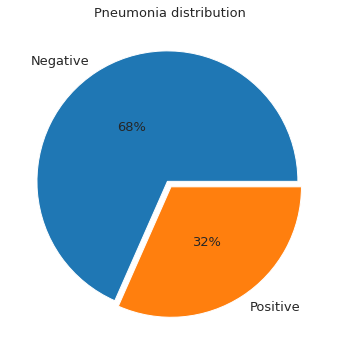

In [9]:
print('No of entries which has Pneumonia : {0} ({1}%)'.format(train_labels[train_labels.Target == 1].shape[0], round(train_labels[train_labels.Target == 1].shape[0]/train_labels.shape[0]*100, 0)))
print('No of entries which don\'t have Pneumonia : {0} ({1}%)\n'.format(train_labels[train_labels.Target == 0].shape[0], round(train_labels[train_labels.Target == 0].shape[0]/train_labels.shape[0]*100, 0)))

plt.figure(figsize=(10,6))
textprops = {'fontsize':13}  # Font size of text in pie chart
train_labels['Target'].value_counts().plot(kind = 'pie', autopct = '%.0f%%', explode = [0.04,0.01], labels = ['Negative', 'Positive'], startangle=0, pctdistance=0.5, labeldistance=1.1, textprops = textprops)
plt.title('Pneumonia distribution', fontdict=textprops)
plt.xlabel('')
plt.ylabel('')
plt.show()

The dataset contains data 30,277 records for 26,684 unique patients. Suggesting some patients have more than one entry (more than one bounding boxes detecting pneumonia).
<br><br>
Out of 30,277 entries in the dataset,<br>
No. of positive cases = 9,555 ~ 32%<br>
No. of negative cases = 20,672 ~ 68%<br>
<br>
To cross verify, we can count the number of bounding boxes with null values for x, y, width and height.
<br>

In [10]:
# Checking nulls in bounding box columns
print('Number of nulls in bounding box columns : {0}'.format(train_labels[['x', 'y', 'width', 'height']].isnull().sum().to_dict()))

Number of nulls in bounding box columns : {'x': 20672, 'y': 20672, 'width': 20672, 'height': 20672}


#### Stage_2_train_class:
The data is divided into 3 labels.
1.	Normal.
2.	Lung opacity.
3.	Not normal/ no lung opacity.

In [11]:
class_labels = pd.read_csv('/content/stage_2_detailed_class_info.csv')
print('First five rows of Class labels dataset are :')
class_labels.head(5)

First five rows of Class labels dataset are :


,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


Some information about the data field present in the 'stage_2_detailed_class_info.csv' are:

patientId - A patientId. Each patientId corresponds to a unique image
class - Have three values depending what is the current state of the patient's lung: 'No Lung Opacity / Not Normal', 'Normal' and 'Lung Opacity'.

In [12]:
# Number of entries in class_label dataframe
print('The class_labels dataframe has {0} rows and {1} columns.'.format(class_labels.shape[0], class_labels.shape[1]))

The class_labels dataframe has 30227 rows and 2 columns.


In [13]:
# Number of duplicates in patients
print('Number of unique patientId are : {0}'.format(class_labels['patientId'].nunique()))

Number of unique patientId are : 26684


Thus, the dataset contains information about 26684 patients (which is same as that of the train_labels dataframe).

In [16]:
def get_feature_distribution(data, feature):
    # Count for each label
    label_counts = data[feature].value_counts()
    # Count the number of items in each class
    total_samples = len(data)
    print('Feature: {}'.format(feature))
    for i in range(len(label_counts)):
        label = label_counts.index[i]
        count = label_counts.values[i]
        percent = int((count / total_samples) * 10000) / 100
        print('{0:<30s}: {1} which is {2}% of the total data in the dataset'.format(label, count, percent))

In [17]:
get_feature_distribution(class_labels, 'class')

Feature: class
No Lung Opacity / Not Normal  : 11821 which is 39.1% of the total data in the dataset
Lung Opacity                  : 9555 which is 31.61% of the total data in the dataset
Normal                        : 8851 which is 29.28% of the total data in the dataset


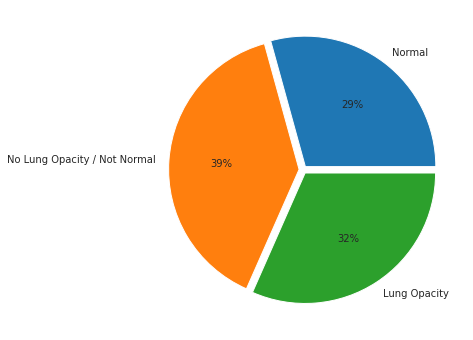

In [18]:
plt.figure(figsize=(10,6))
class_labels['class'].value_counts().sort_index(ascending = False).plot(kind = 'pie', autopct = '%.0f%%', explode = [0.03,0.03,0.03]).set_ylabel('')
plt.show()

In [19]:
# Checking nulls in class_labels
print('Number of nulls in class columns : {0}'.format(class_labels['class'].isnull().sum()))

Number of nulls in class columns : 0


In [20]:
# Checking whether each patientId has only one type of class or not
class_labels.groupby(['patientId'])['class'].nunique().max()

1

- The above code represents that maximum value of unique value is 1.

#### Merged dataset
- Below, the 2 datasets were combined to generate a single dataset to work upon.

In [21]:
# Merging the two dataset - 'train_labels' and 'class_labels'
training_data = pd.concat([train_labels, class_labels['class']], axis = 1)
print('After merging, the dataset looks like : ')
training_data.head()

After merging, the dataset looks like : 


,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity


In [22]:
print('After merge, the dataset has {0} rows and {1} columns.'.format(training_data.shape[0], training_data.shape[1]))

After merge, the dataset has 30227 rows and 7 columns.


Target and Class<br>

The Classes and data are not balanced.<br> 
- Target ‘0’ => Classes Normal and No lung opacity/Not normal.
- Target ‘1’ => Class Lung opacity.


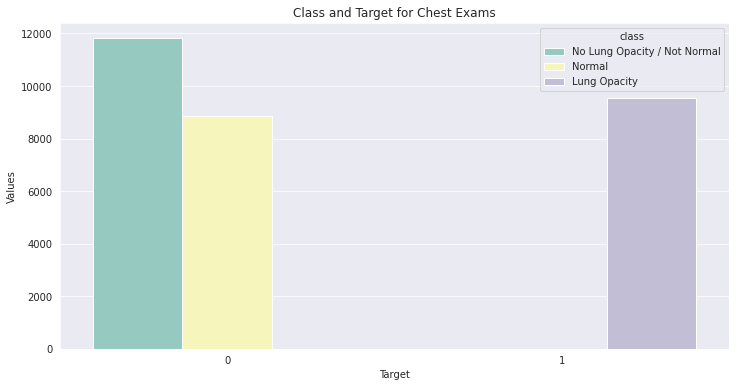

In [23]:
fig, ax = plt.subplots(nrows = 1, figsize = (12, 6))
temp = training_data.groupby('Target')['class'].value_counts()
data_target_class = pd.DataFrame(data = {'Values': temp.values}, index = temp.index).reset_index()
sns.barplot(ax = ax, x = 'Target', y = 'Values', hue = 'class', data = data_target_class, palette = 'Set3')
plt.title('Class and Target for Chest Exams')
plt.show()

Thus, Target = 1 is associated with only class = Lung Opacity whereas Target = 0 is associated with only class = No Lung Opacity / Not Normal as well as Normal.

Bound Box Distribution

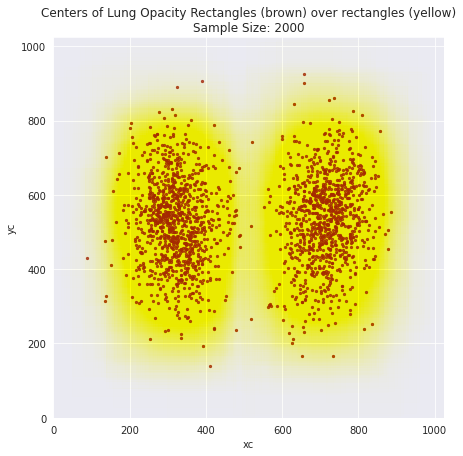

In [24]:
fig, ax = plt.subplots(1, 1, figsize = (7, 7))
target_1 = training_data[training_data['Target'] == 1]
target_sample = target_1.sample(2000)
target_sample['xc'] = target_sample['x'] + target_sample['width'] / 2
target_sample['yc'] = target_sample['y'] + target_sample['height'] / 2
plt.title('Centers of Lung Opacity Rectangles (brown) over rectangles (yellow)\nSample Size: 2000')
target_sample.plot.scatter(x = 'xc', y = 'yc', xlim = (0, 1024), ylim = (0, 1024), ax = ax, alpha = 0.8, marker = '.', color = 'brown')

for i, crt_sample in target_sample.iterrows():
    ax.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                width=crt_sample['width'],height=crt_sample['height'],alpha=3.5e-3, color="yellow"))

We can see that the centers for the bounding box are spread out evenly across the Lungs(red dots). Though a large portion of the bounding box have their centers at the centers of the Lung, but some centers of the box are also located at the edges of lung(yellow portion).

#### stage_2_train_images:
The images used in radiology are stored in DICOM format. 
<br><br>
A DICOM file consists of a header and image data sets packed into a single file. The information within the header is organized as a constant and standardized series of tags. By extracting data from these tags one can access important information regarding the patient demographics, study parameters, etc. Below, we can see the details stored in the dicom files along with the images.
<br>
- Format of images in dicom files = JPEG Baseline.
- Size of images = 1024 x 1024.
- No. of images in stage_2_train_images = 26,684.


In [25]:
sample_patientId = train_labels['patientId'][0]
dcm_file = 'stage_2_train_images/'+'{}.dcm'.format(sample_patientId)
dcm_data = dicom.read_file(dcm_file)

print('Metadata of the image consists of : \n\n', dcm_data)

Metadata of the image consists of : 

 Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '

In [26]:
print('Number of images in training images folders are : {0}'.format(len(os.listdir('stage_2_train_images'))))

Number of images in training images folders are : 26684


Thus, we can see that in the training images folder we have just 26684 images which is same as that of unique patientId's present in either of the csv files. Thus, we can say that each of the unique patientId's present in either of the csv files corresponds to an image present in the folder.

In [27]:
training_image_path = 'stage_2_train_images/'

images = pd.DataFrame({'path': glob(os.path.join(training_image_path, '*.dcm'))})
images['patientId'] = images['path'].map(lambda x:os.path.splitext(os.path.basename(x))[0])
print('Columns in the training images dataframe : {0}'.format(list(images.columns)))

Columns in the training images dataframe : ['path', 'patientId']


#### Merged dataset 2

In [28]:
# Merging the images dataframe with training_data dataframe
training_data = training_data.merge(images, on = 'patientId', how = 'left')
print('After merging the two dataframe, the training_data has {0} rows and {1} columns.'.format(training_data.shape[0], training_data.shape[1]))

After merging the two dataframe, the training_data has 30227 rows and 8 columns.


In [29]:
print('The training_data dataframe as of now stands like,')
training_data.head()

The training_data dataframe as of now stands like,


,patientId,x,y,width,height,Target,class,path
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/0004cfab-14fd-4e49-80ba-6...
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c...
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00322d4d-1c29-4943-afc9-b...
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,stage_2_train_images/003d8fa0-6bf1-40ed-b54c-a...
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,stage_2_train_images/00436515-870c-4b36-a041-d...


In [30]:
columns_to_add = ['Modality', 'PatientAge', 'PatientSex', 'BodyPartExamined', 'ViewPosition', 'ConversionType', 'Rows', 'Columns', 'PixelSpacing']

def parse_dicom_data(data_df, data_path):
    for col in columns_to_add:
        data_df[col] = None
    image_names = os.listdir('stage_2_train_images/')
  
    for i, img_name in tqdm_notebook(enumerate(image_names)):
        imagepath = os.path.join('stage_2_train_images/', img_name)
        data_img = dicom.read_file(imagepath)
        idx = (data_df['patientId'] == data_img.PatientID)
        data_df.loc[idx, 'Modality'] = data_img.Modality
        data_df.loc[idx, 'PatientAge'] = pd.to_numeric(data_img.PatientAge)
        data_df.loc[idx, 'PatientSex'] = data_img.PatientSex
        data_df.loc[idx, 'BodyPartExamined'] = data_img.BodyPartExamined
        data_df.loc[idx, 'ViewPosition'] = data_img.ViewPosition
        data_df.loc[idx, 'ConversionType'] = data_img.ConversionType
        data_df.loc[idx, 'Rows'] = data_img.Rows
        data_df.loc[idx, 'Columns'] = data_img.Columns
        data_df.loc[idx, 'PixelSpacing'] = str.format("{:4.3f}", data_img.PixelSpacing[0])

In [31]:
parse_dicom_data(training_data, 'stage_2_train_images/')

0it [00:00, ?it/s]

#### Merged dataset with Dicom file data:
The data from the Dicom files are now read and put into the dataset.
<br>
Fileds like 'Modality', 'PatientAge', 'PatientSex', 'BodyPartExamined', etc have been added to the dataset for further processing.
<br>

In [32]:
print('So after parsing the information from the dicom images, our training_data dataframe has {0} rows and {1} columns and it looks like, \n'.format(training_data.shape[0], training_data.shape[1]))
training_data.head()

So after parsing the information from the dicom images, our training_data dataframe has 30227 rows and 17 columns and it looks like, 



,patientId,x,y,width,height,Target,class,path,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/0004cfab-14fd-4e49-80ba-6...,CR,51,F,CHEST,PA,WSD,1024,1024,0.143
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c...,CR,48,F,CHEST,PA,WSD,1024,1024,0.194
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00322d4d-1c29-4943-afc9-b...,CR,19,M,CHEST,AP,WSD,1024,1024,0.168
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,stage_2_train_images/003d8fa0-6bf1-40ed-b54c-a...,CR,28,M,CHEST,PA,WSD,1024,1024,0.143
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,stage_2_train_images/00436515-870c-4b36-a041-d...,CR,32,F,CHEST,AP,WSD,1024,1024,0.139


In [33]:
# Saving the training_data for further use
training_data.to_pickle('training_data.pkl')

Going forward we will now use this pickle file as our training data.

# Exploratory Data Analysis
In this section, we'll be analysing Final dataset to summarize their main characteristics, often using statistical graphics and other data visualization methods.

We have the final dataset as below, with 30227 rows and 17 columns.



In [34]:
training_data = pd.read_pickle('training_data.pkl')
print('Our training data consists of {0} rows and {1} columns and looks like as, \n'.format(training_data.shape[0], training_data.shape[1]))
training_data.head()

Our training data consists of 30227 rows and 17 columns and looks like as, 



,patientId,x,y,width,height,Target,class,path,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/0004cfab-14fd-4e49-80ba-6...,CR,51,F,CHEST,PA,WSD,1024,1024,0.143
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c...,CR,48,F,CHEST,PA,WSD,1024,1024,0.194
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00322d4d-1c29-4943-afc9-b...,CR,19,M,CHEST,AP,WSD,1024,1024,0.168
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,stage_2_train_images/003d8fa0-6bf1-40ed-b54c-a...,CR,28,M,CHEST,PA,WSD,1024,1024,0.143
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,stage_2_train_images/00436515-870c-4b36-a041-d...,CR,32,F,CHEST,AP,WSD,1024,1024,0.139


Modality

In [35]:
print('Modality for the images obtained is : {0}'.format(training_data['Modality'].unique()[0]))

Modality for the images obtained is : CR


Body Part Examined

In [36]:
print('The images obtained are of {0} areas.'.format(training_data['BodyPartExamined'].unique()[0]))

The images obtained are of CHEST areas.


Understanding Different Positions:

In [37]:
get_feature_distribution(training_data, 'ViewPosition')

Feature: ViewPosition
AP                            : 15297 which is 50.6% of the total data in the dataset
PA                            : 14930 which is 49.39% of the total data in the dataset


**ViewPosition**<br>
AP : 15297 which is 50.6% of the total data in the dataset
<br>
PA : 14930 which is 49.39% of the total data in the dataset
<br>
As seen above, two View Positions that are in the training dataset are AP (Anterior/Posterior) and PA (Posterior/Anterior).<br> These type of X-rays are mostly used to obtain the front-view. Apart from front-view, a lateral image is usually taken to complement the front-view.
<br>
- Posterior/Anterior (PA): Here the chest radiograph is acquired by passing the X-Ray beam from the patient's posterior (back) part of the chest to the anterior (front) part. While obtaining the image patient is asked to stand with their chest against the film. In this image, the hear is on the right side of the image as one looks at it. These are of higher quality and assess the heart size more accurately
<br>
- Anterior/Posterior (AP): At times it is not possible for radiographers to acquire a PA chest X-ray. This is usually because the patient is too unwell to stand. In these images the size of Heart is exaggerated.

The distribution of View Position when there is an evidence of Pneumonia :



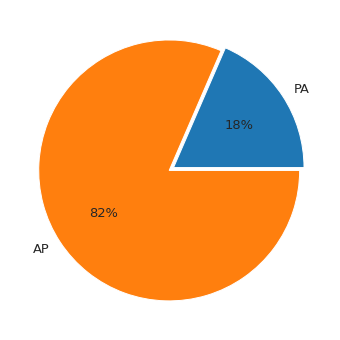

In [38]:
print('The distribution of View Position when there is an evidence of Pneumonia :\n')
plt.figure(figsize=(10,6))
training_data.loc[training_data['Target'] == 1, 'ViewPosition'].value_counts().sort_index(ascending = False).plot(kind = 'pie', autopct = '%.0f%%', explode = [0.03,0.01], textprops = {"fontsize":13}).set_ylabel('')
plt.show()

Plot x and y centers of bounding box



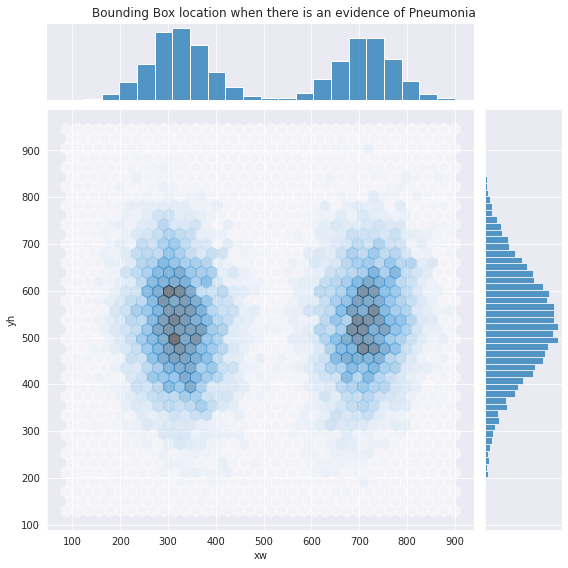

In [39]:
print('Plot x and y centers of bounding box\n')
bboxes = training_data[training_data['Target'] == 1]
bboxes['xw'] = bboxes['x'] + bboxes['width']/2
bboxes['yh'] = bboxes['y'] + bboxes['height']/2

g = sns.jointplot(x = bboxes['xw'], y = bboxes['yh'], data = bboxes,
                  kind = 'hex', alpha = 0.5, size = 8)
plt.suptitle('Bounding Box location when there is an evidence of Pneumonia')
plt.tight_layout()
plt.subplots_adjust(top = 0.95)

In [40]:
def bboxes_scatter(data, color_point, color_window, text):
    fig, ax = plt.subplots(1, 1, figsize = (7, 7))
    plt.title('Plotting centers of Lung Opacity\n{}'.format(text))
    data.plot.scatter(x = 'xw', y = 'yh', xlim = (0, 1024), ylim = (0, 1024), ax = ax, alpha = 0.8, marker = ".", color = color_point)
    for i, crt_sample in data.iterrows():
        ax.add_patch(Rectangle(xy = (crt_sample['x'], crt_sample['y']), width = crt_sample['width'], height = crt_sample['height'], alpha = 3.5e-3, color = color_window))

We now try to see the distribution of bounding boxes with different ViewPosition (AP and PA).<br>
There are multiple outliers in both the cases.

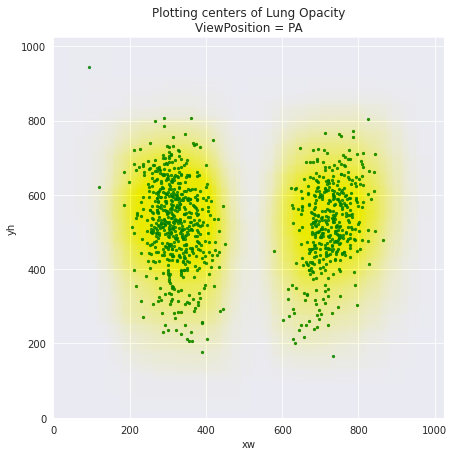

In [41]:
data_PA = bboxes[bboxes['ViewPosition'] == 'PA'].sample(1000)
data_AP = bboxes[bboxes['ViewPosition'] == 'AP'].sample(1000)

bboxes_scatter(data_PA, 'green', 'yellow', 'ViewPosition = PA')

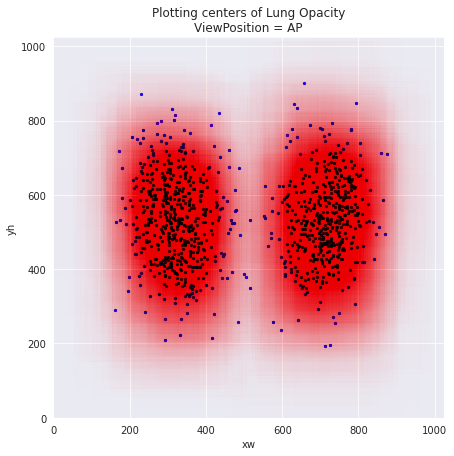

In [42]:
bboxes_scatter(data_AP, 'blue', 'red', 'ViewPosition = AP')

Conversion Type

In [43]:
print('Conversion Type for the data in Training Data : {0}'.format(training_data['ConversionType'].unique()[0]))

Conversion Type for the data in Training Data : WSD


Rows and Columns

In [44]:
print('The training images has {0} rows and {1} columns.'.format(training_data.Rows.unique()[0], training_data.Columns.unique()[0]))

The training images has 1024 rows and 1024 columns.


Patient Sex

In [45]:
def drawgraphs(data_file, columns, hue = False, width = 15, showdistribution = True):
    if (hue):
        print('Creating graph for : {} and {}\n'.format(columns, hue))
    else:  
        print('Creating graph for : {}\n'.format(columns))
    length = len(columns) * 6
    total = float(len(data_file))

    fig, axes = plt.subplots(nrows = len(columns) if len(columns) > 1 else 1, ncols = 1, figsize = (width, length))
    for index, content in enumerate(columns):
        plt.title(content)

    currentaxes = 0
    if (len(columns) > 1):
        currentaxes = axes[index]
    else:
        currentaxes = axes

    if (hue):
        sns.countplot(x = columns[index], data = data_file, ax = currentaxes, hue = hue)
    else:
        sns.countplot(x = columns[index], data = data_file, ax = currentaxes)

    if(showdistribution):
        for p in (currentaxes.patches):
            height = p.get_height()
            if (height > 0 and total > 0):
                currentaxes.text(p.get_x() + p.get_width()/2., height + 3, '{:1.2f}%'.format(100*height/total), ha = "center")


- We'll divide the data based on Patient sex.
- From below graph, we understand that division of data between male and female is divided as 57% abd 43% respectively.

Creating graph for : ['PatientSex']



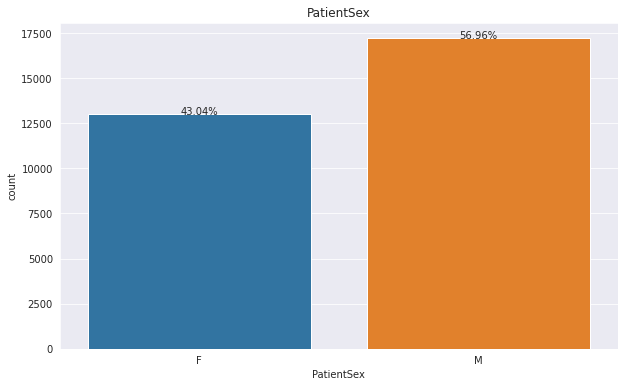

In [46]:
drawgraphs(data_file = training_data, columns = ['PatientSex'], hue = False, width = 10, showdistribution = True)

In [47]:
get_feature_distribution(training_data, 'PatientSex')

Feature: PatientSex
M                             : 17216 which is 56.95% of the total data in the dataset
F                             : 13011 which is 43.04% of the total data in the dataset


Thus, out of 30227 records, there are 17216 records of M (Male) and 13011 records of F (Female).

- The distribution graph below represents the divion of classes based on the patient Gender.
- 13.2% of the **FEMALE** population has been diagnosed with Pneumonia.
- 18.4% of total MALE population has been diagnosed with Opacity deducing Pneumonia. 

Creating graph for : ['PatientSex'] and class



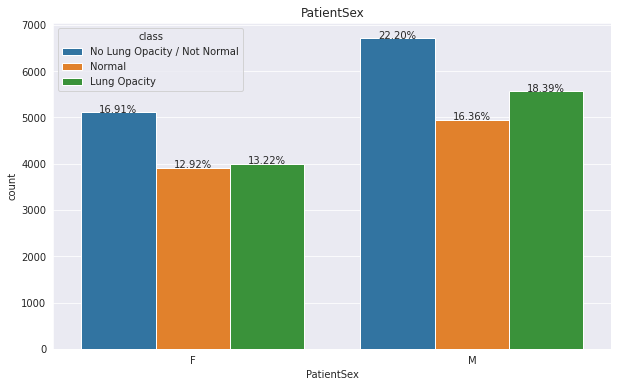

In [48]:
drawgraphs(data_file = training_data, columns = ['PatientSex'], hue = 'class', width = 10, showdistribution = True)

Creating graph for : ['PatientSex'] and Target



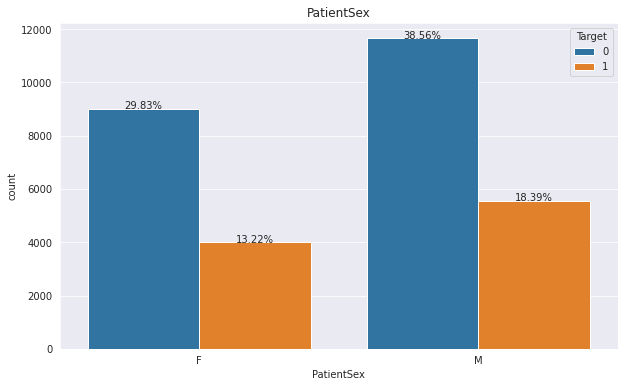

In [49]:
drawgraphs(data_file = training_data, columns = ['PatientSex'], hue = 'Target', width = 10, showdistribution = True)

Thus, we can see that the number of Male patients suffering from Pneumonia is greater when compared with that of Females.

- The Scatter plot has been made to see the spread of the Pneumonia based on the gender.
- In both Gender, we can see that the center of bounbding boxes has been spread evenly with few outliers in both cases.

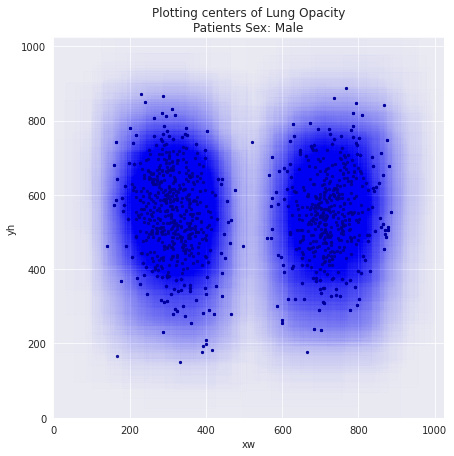

In [50]:
data_male = bboxes[bboxes['PatientSex'] == 'M'].sample(1000)
data_female = bboxes[bboxes['PatientSex'] == 'F'].sample(1000)

bboxes_scatter(data_male, "darkblue", "blue", "Patients Sex: Male")

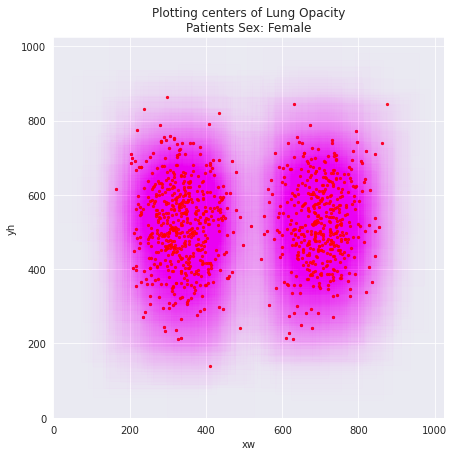

In [51]:
bboxes_scatter(data_female, "red", "magenta", "Patients Sex: Female")

**Patient** **Age**
- The analysis below will be based on the distribution iof population based on age. 
- The Minimum age group in or study is 1 year.
- The maximum age patient recorded in dataset is of 155 years. (this seems to be an outlier interms of age record) 

In [52]:
print('The minimum and maximum recorded age of the patients are {0} and {1} respectively.'.format(training_data['PatientAge'].min(), training_data['PatientAge'].max()))

The minimum and maximum recorded age of the patients are 1 and 155 respectively.


The number of outliers in `PatientAge` out of 30277 records are : 5

The ages which are in the outlier categories are : [148, 151, 153, 150, 155]



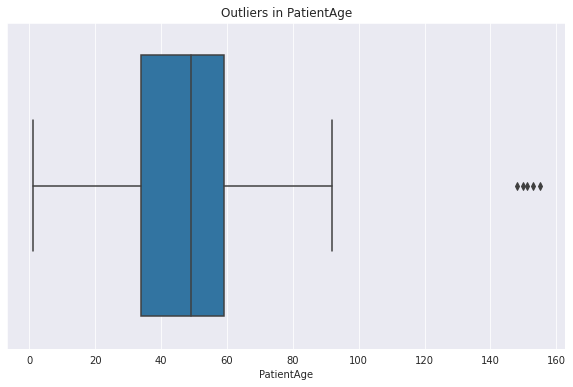

In [53]:
age_25 = np.percentile(training_data['PatientAge'], 25)
age_75 = np.percentile(training_data['PatientAge'], 75)
iqr_age = age_75 - age_25
cutoff_age = 1.5 * iqr_age

low_lim_age = age_25 - cutoff_age
upp_lim_age = age_75 + cutoff_age

outlier_age = [x for x in training_data['PatientAge'] if x < low_lim_age or x > upp_lim_age]
print('The number of outliers in `PatientAge` out of 30277 records are : {0}\n'.format(len(outlier_age)))
print('The ages which are in the outlier categories are : {0}\n'.format(outlier_age))

fig = plt.figure(figsize = (10, 6))
sns.boxplot(training_data['PatientAge'], orient = 'h').set_title('Outliers in PatientAge')
plt.show()

- We see that the age group 148, 150, 151, 153 and 155 are incorrect entries. For our study, we take the maximum gae of the patient to be of 100 Years.
- To confirm, we plot the distribution chart below to see the number of patients in a given age group.

- We understand that maximum numbers of patients recorded belong to 56-58 years of age.

Creating graph for : ['PatientAge']



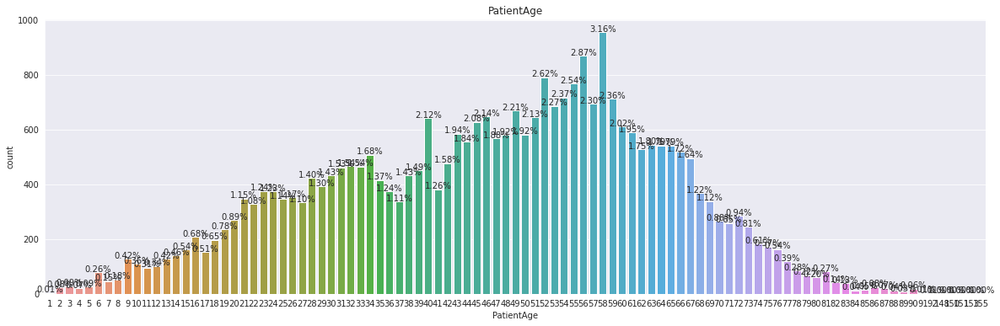

In [54]:
drawgraphs(data_file = training_data, columns = ['PatientAge'], width = 20, showdistribution = True)

In [55]:
print('Removing the outliers from `PatientAge`')
training_data['PatientAge'] = training_data['PatientAge'].clip(training_data['PatientAge'].min(), 100)
training_data['PatientAge'].describe().astype(int)

Removing the outliers from `PatientAge`


count     30227
unique       93
top          58
freq        955
Name: PatientAge, dtype: int64

- In order to have a more clear idea, we will introduce a new column **Patient Age Bin** where the patients will be placed in an age group of 10.

Distribution of `PatientAge`: Overall and Target = 1



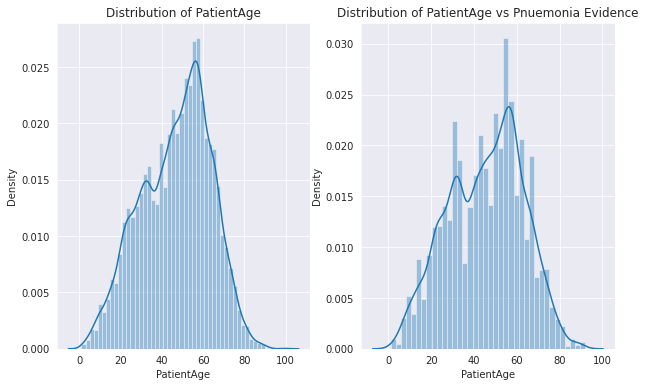

In [56]:
print('Distribution of `PatientAge`: Overall and Target = 1\n')
fig = plt.figure(figsize = (10, 6))

ax = fig.add_subplot(121)
g = (sns.distplot(training_data['PatientAge']).set_title('Distribution of PatientAge'))

ax = fig.add_subplot(122)
g = (sns.distplot(training_data.loc[training_data['Target'] == 1, 'PatientAge']).set_title('Distribution of PatientAge vs Pnuemonia Evidence'))

In [57]:
custom_array = np.linspace(0, 100, 11)
training_data['PatientAgeBins'] = pd.cut(training_data['PatientAge'], custom_array)
training_data['PatientAgeBins'].value_counts()

(50.0, 60.0]     7446
(40.0, 50.0]     5671
(60.0, 70.0]     4730
(30.0, 40.0]     4551
(20.0, 30.0]     3704
(10.0, 20.0]     1688
(70.0, 80.0]     1637
(0.0, 10.0]       515
(80.0, 90.0]      275
(90.0, 100.0]      10
Name: PatientAgeBins, dtype: int64

- The max number of patients belong to age group (50,60] and least to (90,100].

In [58]:
print('After adding the bin column, the dataset turns out to be :\n')
training_data.head()

After adding the bin column, the dataset turns out to be :



,patientId,x,y,width,height,Target,class,path,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing,PatientAgeBins
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/0004cfab-14fd-4e49-80ba-6...,CR,51,F,CHEST,PA,WSD,1024,1024,0.143,"(50.0, 60.0]"
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00313ee0-9eaa-42f4-b0ab-c...,CR,48,F,CHEST,PA,WSD,1024,1024,0.194,"(40.0, 50.0]"
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,stage_2_train_images/00322d4d-1c29-4943-afc9-b...,CR,19,M,CHEST,AP,WSD,1024,1024,0.168,"(10.0, 20.0]"
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,stage_2_train_images/003d8fa0-6bf1-40ed-b54c-a...,CR,28,M,CHEST,PA,WSD,1024,1024,0.143,"(20.0, 30.0]"
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,stage_2_train_images/00436515-870c-4b36-a041-d...,CR,32,F,CHEST,AP,WSD,1024,1024,0.139,"(30.0, 40.0]"


Creating graph for : ['PatientAgeBins']



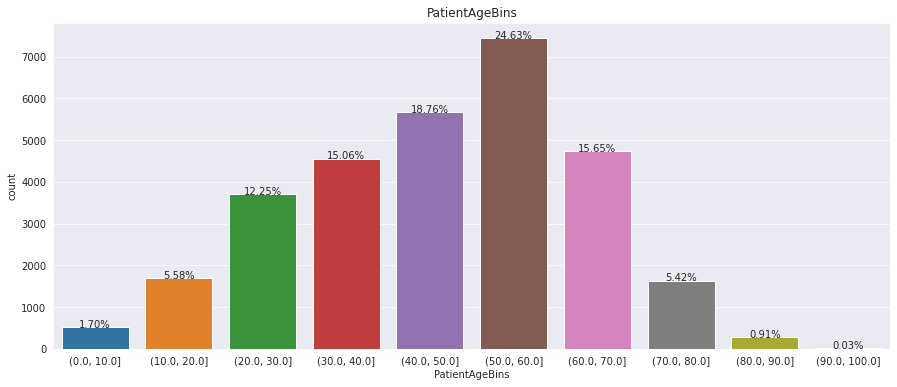

In [59]:
drawgraphs(data_file = training_data, columns = ['PatientAgeBins'], width = 15, showdistribution = True)

Creating graph for : ['PatientAgeBins'] and PatientSex



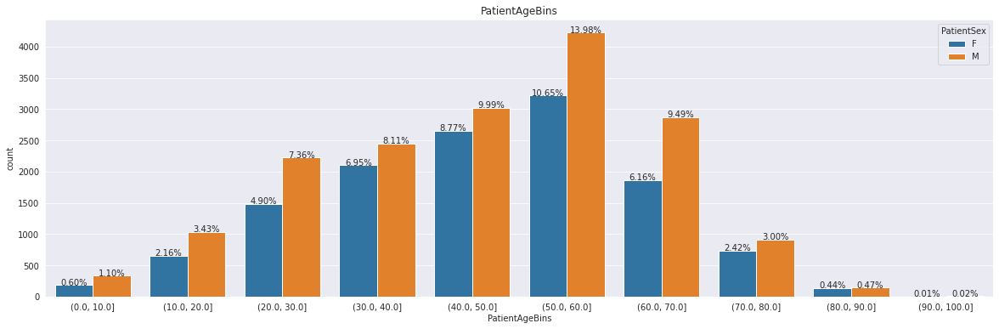

In [60]:
drawgraphs(data_file = training_data, columns = ['PatientAgeBins'], hue = 'PatientSex', width = 20, showdistribution = True)

Creating graph for : ['PatientAgeBins'] and class



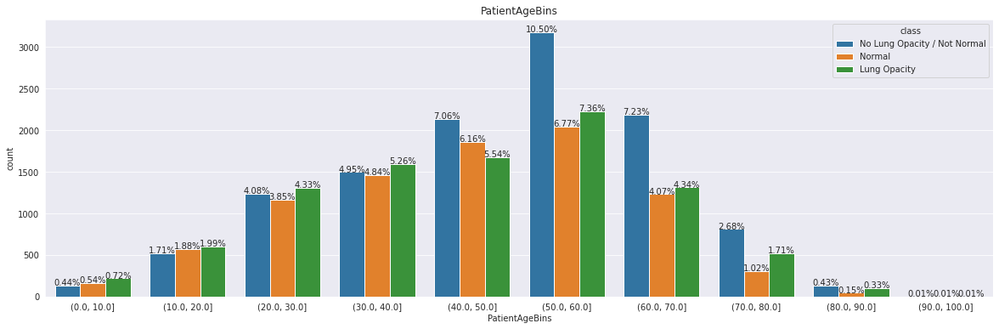

In [61]:
drawgraphs(data_file = training_data, columns = ['PatientAgeBins'], hue = 'class', width = 20, showdistribution = True)

Creating graph for : ['PatientAgeBins'] and Target



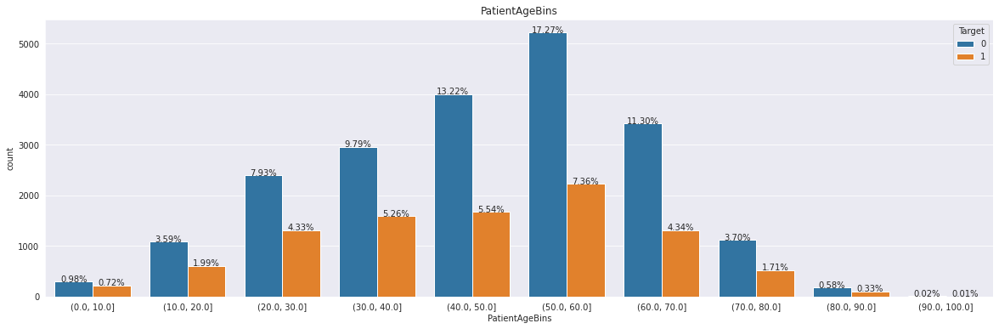

In [62]:
drawgraphs(data_file = training_data, columns = ['PatientAgeBins'], hue = 'Target', width = 20, showdistribution = True)

- The maximum number of patients in our dataset are between 50-60 years of age contributing 24.63% of total population.
- In this age group, the females cover 10.65% and males are 13.98%   
- The same agegroup also contains the highest number of patients with diagnosed Pneuonia contributing 17.27%.

- The Scatter charts below describes the distribution of Bounding boxes and pneumonia detected regions based on the age-group.
- The age division is as follows:
1. Less than 20 years
2. Between 20 and 35 years
3. Between 35 and 50 years
4. Between 50 and 65 years
5. Greater than 65%

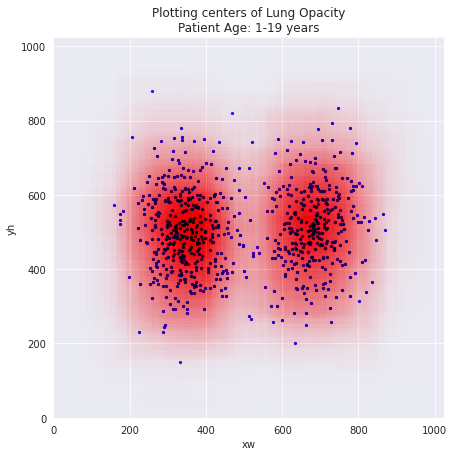

In [63]:
data_age_19 = bboxes[bboxes['PatientAge'] < 20]
data_age_20_34 = bboxes[(bboxes['PatientAge'] >= 20) & (bboxes['PatientAge'] < 35)]
data_age_35_49 = bboxes[(bboxes['PatientAge'] >= 35) & (bboxes['PatientAge'] < 50)]
data_age_50_64 = bboxes[(bboxes['PatientAge'] >= 50) & (bboxes['PatientAge'] < 65)]
data_age_65 = bboxes[bboxes['PatientAge'] >= 65]

bboxes_scatter(data_age_19,'blue', 'red', 'Patient Age: 1-19 years')

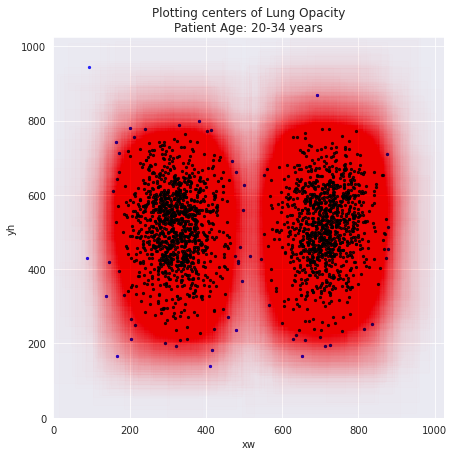

In [64]:
bboxes_scatter(data_age_20_34, 'blue', 'red', 'Patient Age: 20-34 years')

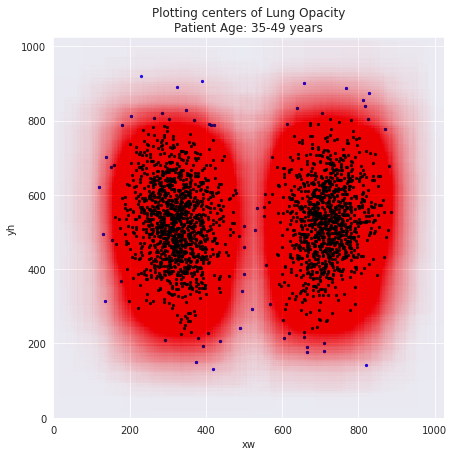

In [65]:
bboxes_scatter(data_age_35_49, 'blue', 'red', 'Patient Age: 35-49 years')

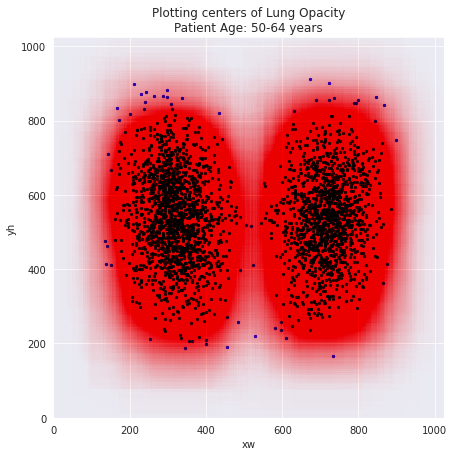

In [66]:
bboxes_scatter(data_age_50_64, 'blue', 'red', 'Patient Age: 50-64 years')

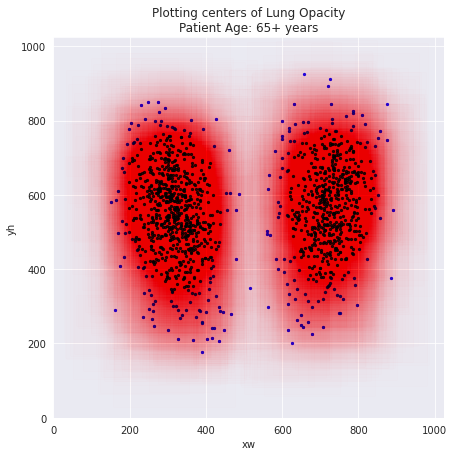

In [67]:
bboxes_scatter(data_age_65, 'blue', 'red', 'Patient Age: 65+ years')

**Plotting DICOM Images:**
To view the Training images, the DICOM image data is plotted.
- The images under CLass '0' belongs to the patients with no pneumonia detection. These patients have been cleared of this disease with no abnormility in chest x-ray.
- Images with Class '1' are of patients with pneumonia. The image also depicts the area where the pneumonia has affected the lungs. These parts have been marked with blue bounding boxes.

In [68]:
def show_dicom_images(data, df, img_path):
    img_data = list(data.T.to_dict().values())
    f, ax = plt.subplots(3, 3, figsize = (16, 18))
  
    for i, row in enumerate(img_data):
        image = row['patientId'] + '.dcm'
        path = os.path.join(img_path, image)
        data = dicom.read_file(path)
        rows = df[df['patientId'] == row['patientId']]
        age = rows.PatientAge.unique().tolist()[0]
        sex = data.PatientSex
        part = data.BodyPartExamined
        vp = data.ViewPosition
        modality = data.Modality
        data_img = dicom.dcmread(path)
        ax[i//3, i%3].imshow(data_img.pixel_array, cmap = plt.cm.bone)
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title('ID: {}\nAge: {}, Sex: {}, Part: {}, VP: {}, Modality: {}\nTarget: {}, Class: {}\nWindow: {}:{}:{}:{}'\
                            .format(row['patientId'], age, sex, part,
                                    vp, modality, row['Target'],
                                    row['class'], row['x'],
                                    row['y'], row['width'],
                                    row['height']))
        box_data = list(rows.T.to_dict().values())
    
        for j, row in enumerate(box_data):
            ax[i//3, i%3].add_patch(Rectangle(xy = (row['x'], row['y']), width = row['width'], height = row['height'], color = 'red', alpha = 0.20))
    plt.show()

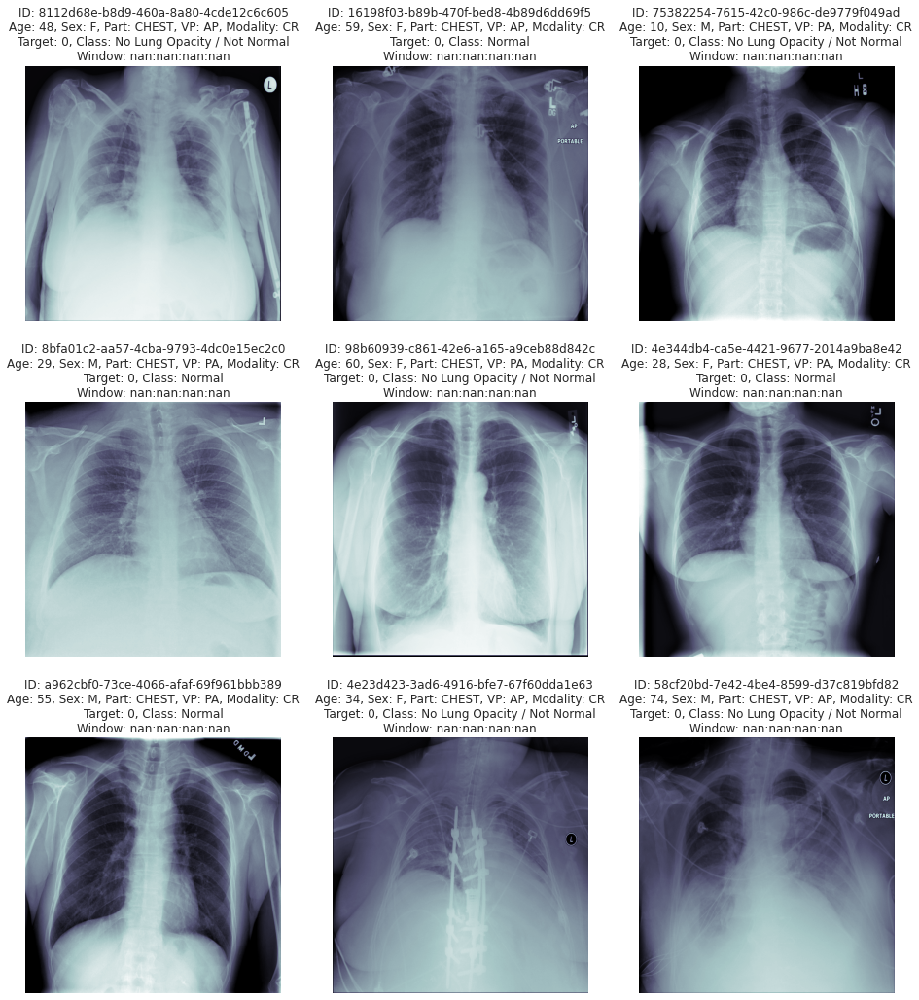

In [69]:
# For Target=0
show_dicom_images(data = training_data.loc[(training_data['Target'] == 0)].sample(9), df = training_data, img_path = 'stage_2_train_images/')

As the above subplots are of the images which belong to either "Normal" or "No Lung Opacity / Not Normal", hence no bounding box is observed.



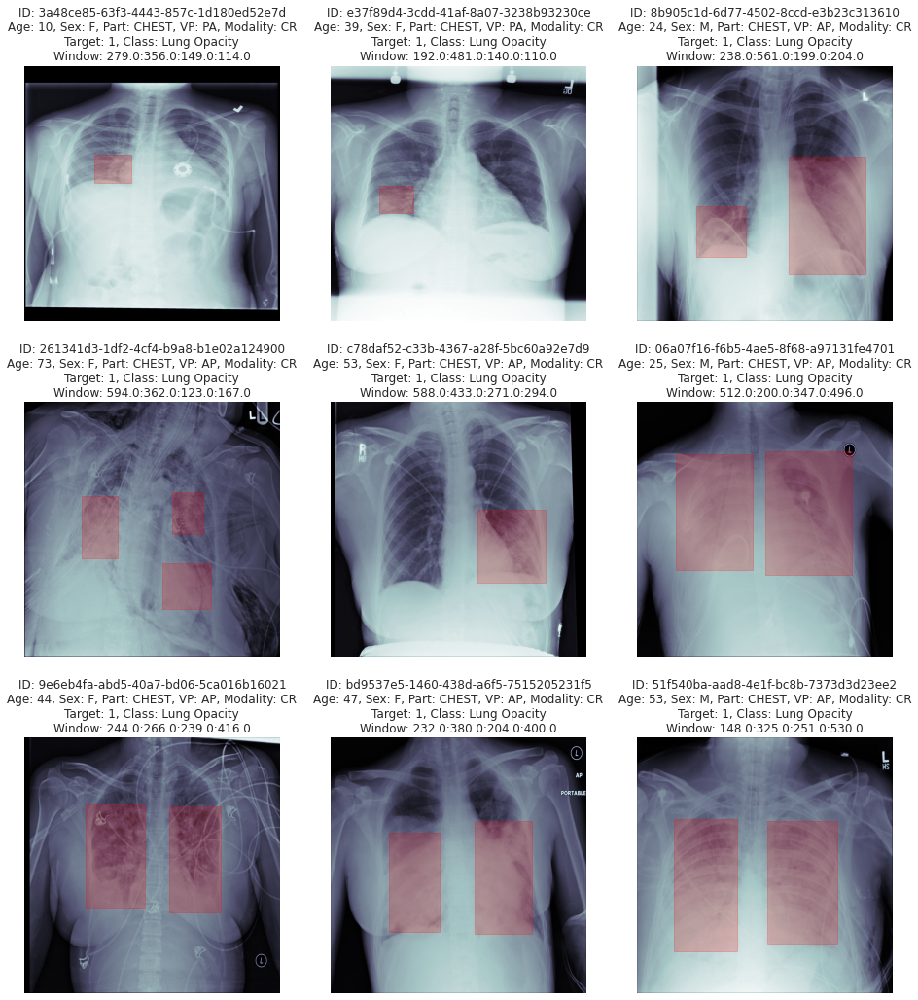

In [ ]:
# For Target=1
show_dicom_images(data = training_data.loc[(training_data['Target'] == 1)].sample(9), df = training_data, img_path = 'stage_2_train_images/')

In the above subplots, we can see that the area covered by the box (in red colour) depicts the area of interest i.e., the area in which the opacity is observed in the Lungs.

# Overview of the final process

#### **_EDA_**

- The training dataset (both of the csv files and the training image folder) contains information of 26684 unique patients.

- Out of these 26684 unique patients some of these have multiple entries in the both of the csv files.

- Most of the recorded patient belong to Target = 0 (i.e., they don't have Pneumonia).

- Some of the patients have more than one bounding box. The maximum being 4.

- The classes "No Lung Opacity / Not Normal" and "Normal" is associated with Target = 0 whereas "Lung Opacity" belong to Target = 1

- The images are present in dicom format, from which information like PatientAge, PatientSex, ViewPosition etc are obtained
There are two ways from which images were obtained: AP and PA. The age ranges from 1-155 (which were further clipped to 100).

- The centers of the bounding box are spread out over the entire region of the lungs. But there are some centers which are outliers.

#### **_Model Building and Pre-Processing:_**

- New columns names are created and mapping done from original dataframe

- Class-3 which has 'No Lung Opacity/Not Normal' is removed.

- Balancing is done for classes as there are 3398 samples with lung opacity and 11465 with Normal. For instance, if we have 10 images with target label 1 and 100 images with target label 0 then below script will take all 10 images with label 1 and 10 randomly chosen images without replacement from the set of 100 images with label 0 and combine them to create a balanced set of 20 images. So this way we are able to get 1:1 distribution of classes.

- We got images in HD resolution which is 1024x1024 so we need to downsize to 128x128,reason for using 128 size images is that we will be using Transfer Learning model called MobileNet pretrained on ImageNet Dataset. Since this problem is not only about prediction of classes (classification problem) also we need to predict coordinates of bounding boxes. So, we will be using UNET architecture for the problem solution. For this we created a user defined function and that function return training images array(X_train) with corresponding mask and target variable.

- One Hot Encoding is performed on target variable.

- For Classification, Sequential CNN, MobileNet, InceptionV3 are used and for UNet(Incombination with classifier) is used for detecting bounding boxes.

- Model comparison is shown in the form of DataFrame and plotted the scores & losses.

# Step-by-step walk through of the solution

- After each code cell, we've provided appropriate comments explaining the working and outcomes.

# Model Building
In this section, we'll be building various models for Pneumonia detection.

In [ ]:
folders = ['stage_2_train_images', 'stage_2_test_images']
path = '/content'

# Checking the number of files in folders
for f in folders:
    print('No. of files in {0} : {1}'.format(f,len(os.listdir(os.path.join(path,f)))))

No. of files in stage_2_train_images : 26684
No. of files in stage_2_test_images : 3000


In [ ]:
# Creating new column names and mapping from the original Dataframe
ColName = ['patientid','x1','y1','w1','h1','x2','y2','w2','h2','Target','Class','Gender']

# Iterating over patientId to get unique record
final_list=[]
for ids in np.unique(train_labels['patientId']):
    meta_info = dicom.read_file('/content/stage_2_train_images/'+ids+'.dcm')
    if len(list(train_labels['x'][train_labels['patientId']==ids]))>1:  # We are considering only patientId with 2 bounding boxes
        ls=[]
        ls.append(ids)
        ls.append(list(train_labels[train_labels['patientId']==ids]['x'])[0])
        ls.append(list(train_labels[train_labels['patientId']==ids]['y'])[0])
        ls.append(list(train_labels[train_labels['patientId']==ids]['width'])[0])
        ls.append(list(train_labels[train_labels['patientId']==ids]['height'])[0])
        ls.append(list(train_labels[train_labels['patientId']==ids]['x'])[1])
        ls.append(list(train_labels[train_labels['patientId']==ids]['y'])[1])
        ls.append(list(train_labels[train_labels['patientId']==ids]['width'])[1])
        ls.append(list(train_labels[train_labels['patientId']==ids]['height'])[1])
        ls.append(list(train_labels[train_labels['patientId']==ids]['Target'])[1])
        ls.append(list(class_labels[class_labels['patientId']==ids]['class'])[0])
        ls.append(meta_info.PatientSex)
        final_list.append(ls)
    else:
        ls=[ids,0,0,0,0,0,0,0,0,0]
        ls.append(list(class_labels[class_labels['patientId']==ids]['class'])[0])
        ls.append(meta_info.PatientSex)
        final_list.append(ls)

# Saving the dataframe
final_df = pd.DataFrame(final_list, columns=ColName)

In [ ]:
# Removing the 3rd class (No Lung Opacity / Not Normal) from dataframe
final_df = final_df[final_df['Class'] != 'No Lung Opacity / Not Normal']

print('The final_df has {0} rows and {1} columns.\n'.format(final_df.shape[0],final_df.shape[1]))
# First 5 rows of dataframe
final_df.head(5)

The final_df has 14863 rows and 12 columns.



,patientid,x1,y1,w1,h1,x2,y2,w2,h2,Target,Class,Gender
1,000924cf-0f8d-42bd-9158-1af53881a557,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Normal,F
2,000db696-cf54-4385-b10b-6b16fbb3f985,316.0,318.0,170.0,478.0,660.0,375.0,146.0,402.0,1,Lung Opacity,F
3,000fe35a-2649-43d4-b027-e67796d412e0,570.0,282.0,269.0,409.0,83.0,227.0,296.0,438.0,1,Lung Opacity,M
4,001031d9-f904-4a23-b3e5-2c088acd19c6,66.0,160.0,373.0,608.0,552.0,164.0,376.0,676.0,1,Lung Opacity,M
5,0010f549-b242-4e94-87a8-57d79de215fc,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Normal,M


In [ ]:
# Class distribution
final_df.groupby('Target').count()['Class']

Target
0    11465
1     3398
Name: Class, dtype: int64

Data pre-processing is first step for any AI ML problem and this step is very important for the prediction power of any model. 
Here we have images in dicom format so first we need to save them in an array so that we could train model with that and secondly we got images in HD resolution which is 1024x1024 so we need to downsize to 128x128,reason for using 128 size images is that we will be using Transfer Learning model called MobileNet pretrained on ImageNet Dataset.
Since this problem is not only about prediction of classes (classification problem) also we need to predict coordinates of bounding boxes. So, we will be using UNET architecture for the problem solution. For this we created a user defined function and that function return training images array(X_train) with corresponding mask and target variable.


In [ ]:
# Fuction which will return X_train, Mask and Target

def image_resizer_mask_generator(path, new_im_w, new_im_h):
    listing=[x+'.dcm' for x in final_df['patientid'].unique()]

    # Initialize X_train
    X_train = np.zeros((len(listing), new_im_w, new_im_h, 3))
    # Initialize Mask
    mask = np.zeros((len(listing), new_im_w, new_im_h))
    # Initialize Target
    target = np.zeros(len(listing))
    i=1
    for index in range(len(listing)):
        os.chdir(os.path.join(path,'stage_2_train_images'))
        img = dicom.dcmread(listing[index])  # Read Dicom image
        img_arr = img.pixel_array
        img_arr = np.stack([img_arr]*3, axis=2) # Convert to 3 channels
        orig_im_h, orig_im_w, channels = img_arr.shape 
        img_arr_resize = cv2.resize(img_arr, (new_im_w, new_im_h))
        # Feed to X_train
        X_train[index] = np.array(img_arr_resize, dtype=np.float32)
        ids=listing[index].replace('.dcm','')
        ids,x1,y1,w1,h1,x2,y2,w2,h2,tgt,label = [np.array(final_df[final_df['patientid']==ids])[0][i] for i in range(11)]
        target[index] = tgt
        if x1>0:
            ratio_w=new_im_w/orig_im_w
            ratio_h=new_im_h/orig_im_h
            new_x1=int(x1*ratio_w)
            new_y1=int(y1*ratio_h)
            new_x2=int(x2*ratio_w)
            new_y2=int(y2*ratio_h)
            new_w1=int(w1*ratio_w)
            new_h1=int(h1*ratio_h)
            new_w2=int(w2*ratio_w)
            new_h2=int(h2*ratio_h)  
            mask[index][new_y1:new_y1+new_h1, new_x1:new_x1+new_w1] = 1
            mask[index][new_y2:new_y2+new_h2, new_x2:new_x2+new_w2] = 1
        i+=1

    return X_train, mask, target

In [ ]:
(X_train, mask, target) = image_resizer_mask_generator('/content', 128, 128)  # Resizing images to 128 x 128

Since we also observed that data distribution is imbalanced for this, we wrote a script which first separate out two classes images into separate variable then combine full set of images with target label 1 and a subset of randomly picked images with label 0(that subset must be of length equal to the length of the full set for target 1)
For instance, if we have 10 images with target label 1 and 100 images with target label 0 then below script will take all 10 images with label 1 and 10 randomly chosen images without replacement from the set of 100 images with label 0 and combine them to create a balanced set of 20 images.
So this way we are able to get 1:1 distribution of classes.


In [ ]:
# Split target = 0
X_train_0 = X_train[target==0]
mask_0 = mask[target==0]
target_0 = target[target==0]
print('Length for Target=0 : {0}'.format(len(target_0)))

# Split target = 1
X_train_1 = X_train[target==1]
mask_1 = mask[target==1]
target_1 = target[target==1]
print('Length for Target=1 : {0}'.format(len(target_1)))

# Balance the Class using random function
X_train_balanced = np.zeros((2*len(target_1), X_train_1.shape[1], X_train_1.shape[2], X_train_1.shape[3]))
mask_balanced = np.zeros((2*len(target_1), mask_1.shape[1], mask_1.shape[2]))
target_balanced = np.zeros((2*len(target_1)))

index=0
for i in (np.random.choice(len(target_0), len(target_1), replace=False)):
    X_train_balanced[index] = X_train_0[i]
    mask_balanced[index] = mask_0[i]
    target_balanced[index] = target_0[i]
    index+=1

j=0
for idx in np.arange(len(target_1), X_train_balanced.shape[0], 1):
    X_train_balanced[idx] = X_train_1[j]
    mask_balanced[idx] = mask_1[j]
    target_balanced[idx] = target_1[j]
    j+=1

Length for Target=0 : 11465
Length for Target=1 : 3398


In [ ]:
# Length after balancing
len(X_train_balanced), len(mask_balanced), len(target_balanced)

(6796, 6796, 6796)

In [ ]:
# One hot encoding target variable
target_encoded = tf.keras.utils.to_categorical(target_balanced, num_classes=2)

# Shuffling the whole data
from sklearn.utils import shuffle
X_train_balanced, mask_balanced, target_encoded = shuffle(X_train_balanced, mask_balanced, target_encoded)

In [ ]:
# Deleted variables to save memory
del X_train
del mask
del target

Before training the model, we need to divide whole set into training and evaluation set and here for Classification model we took first 5000 images as training set and remaining images is for evaluation of the performance on unseen data.
And for the prediction of bounding boxes using UNET architecture we are using different set for training and evaluation. As we thought that if the person is normal then we don’t need to do any prediction of boxes for those images. Hence, we are feeding only those images which has some abnormality present and for them we need to highlight those affected area via bounding boxes.
So, for UNET we created another set containing only images with target as 1 (Lung Opacity) and tried to predict mask and bounding boxes thereafter. For Evaluation set we took first 10 images and remaining images for training the UNET model.


In [ ]:
# Taking first 5000 records for training and rest for evaluation
Train_X = X_train_balanced[0:5000,:,:,:]
Eval_X = X_train_balanced[5000:,:,:,:]

# Train_mask = mask_balanced[0:5000,:,:]
# Eval_mask = mask_balanced[5000:,:,:]

Train_y = target_encoded[0:5000]
Eval_y = target_encoded[5000:]

# For computation restrictions, we are training UNET only on images which has targer as 1 (Lung Opacity).
# Taking first 10 records for evaluation and rest for training
Train_X_unet = X_train_1[10:]
Eval_X_unet = X_train_1[0:10]

Train_mask_unet = mask_1[10:]
Eval_mask_unet = mask_1[0:10]

**Highlights of Base Classifier Model:**

- Used TensorFlow 2.0 and Keras wrapper for building classification model.

- Used Conv layers of 64 and 128 features with same padding.

- Applied 2x2 kernel Maxpooling2D layers to make the model lighter.

- Relu is used as activation function.

- After flattening of feature vector, we applied 2 dense layers and last layer with SoftMax activation.

- Achieved Evaluation accuracy obtained is 82%


### Custom functions for modelling

In [ ]:
# Function to plot accuracy and loss
def plot_accuracy_loss(history, model_type='UNET'):
    plt.figure(figsize=(20,6))

    # Plotting the Train accuracy, Validation accuracy vs number of Epochs
    plt.subplot(1, 2, 1)
    if(model_type=='CLF'):
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
        plt.ylabel('Accuracy')
    else:
        plt.plot(history.history['dice_coefficient'])
        plt.plot(history.history['val_dice_coefficient'])
        plt.ylabel('Dice Coefficient')
    plt.xlabel('Epoch')
    plt.title('Model Accuracy')
    plt.legend(['Train Accuracy', 'Val Accuracy'], loc='lower right')

    # Plotting the Train loss, Validation loss vs number of Epochs
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train Loss', 'Val Loss'], loc='upper right')

    plt.show()

In [ ]:
# Model Evaluation
def evaluate_model(model, Eval_X, Eval_y, Train_X, Train_y, model_type='UNET'):
    eval_results = model.evaluate(Eval_X, Eval_y)
    train_results = model.evaluate(Train_X, Train_y)
    if(model_type=='CLF'):
        print('Accuracy on Eval set = {0:.2f}% & Loss on Eval set = {1:.4f}'.format(eval_results[1]*100, eval_results[0]))
        train_acc = round(train_results[1]*100, 2)
        eval_acc = round(eval_results[1]*100, 2)
    else:
        print('Dice Coefficient on Eval set = {0:.4f} & Loss on Eval set = {1:.4f}'.format(eval_results[1], eval_results[0]))
        train_acc = round(train_results[1], 4)
        eval_acc = round(eval_results[1], 4)

    train_loss = round(train_results[0], 4)
    eval_loss = round(eval_results[0], 4)

    return eval_acc, eval_loss, train_acc, train_loss

In [ ]:
# Dictionary to store the models, scores & loss
clf_model_scores = {'Model':[], 'Train Score':[], 'Eval Score':[], 'Train Loss':[], 'Eval Loss':[]}
unet_model_scores = {'Model':[], 'Train Score':[], 'Eval Score':[], 'Train Loss':[], 'Eval Loss':[]}

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

def clf_report_and_conf_matrix(model, Eval_X, Eval_y):
    prediction = model.predict(Eval_X)  # Predict using the model
    y_pred = np.argmax(prediction, axis=1)
    y_actual = np.argmax(Eval_y, axis=1)
    print('Classification Report:\n')
    print(classification_report(y_actual, y_pred))  # Print Classification report
    print('\n')

    # Confusion matrix to evaluate the accuracy of a classification
    cm = confusion_matrix(y_actual, y_pred)
    df_cm = pd.DataFrame(cm, 
                        index = [i for i in ['Non-Pneumonia','Pneumonia']],
                        columns = [i for i in ['Non-Pneumonia','Pneumonia']])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True ,fmt='g', cmap='coolwarm', linewidths=1)  # Display confusion matrix
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:
# Applying callbacks

early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5, mode='min')
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.2, patience=5, min_lr=1e-6, mode='min')
# checkpoint = tf.keras.callbacks.ModelCheckpoint('model-{loss:.2f}.h5', monitor='loss', save_best_only=True, save_weights_only=True, mode='min', save_freq=1)

In [ ]:
# Define Dice Coefficient
def dice_coefficient(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return numerator / (denominator + tf.keras.backend.epsilon())

# Define Loss function
def loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) - tf.keras.backend.log(dice_coefficient(y_true, y_pred) + tf.keras.backend.epsilon())

### Basic Sequential CNN Model

In [ ]:
# Apply Pre-processing
Train_X_clf_1 = tf.keras.applications.mobilenet.preprocess_input(np.copy(Train_X))
Eval_X_clf_1 = tf.keras.applications.mobilenet.preprocess_input(np.copy(Eval_X))

In [ ]:
# Basic CNN Model Architecture
# Sequential model
model_clf_1 = tf.keras.models.Sequential()

# Add the first convolution layer
model_clf_1.add(tf.keras.layers.Conv2D(32, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu', input_shape=(128, 128, 3))) 
# Add the first pooling layer
model_clf_1.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))

# Add the second convolution layer
model_clf_1.add(tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
# Add the second pooling layer
model_clf_1.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
# Add dropout layer 
model_clf_1.add(tf.keras.layers.Dropout(0.2))

# Add the third convolution layer
model_clf_1.add(tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
# Add the third pooling layer
model_clf_1.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
# Add dropout layer
model_clf_1.add(tf.keras.layers.Dropout(0.2))

# Flatten the matrix into vector
model_clf_1.add(tf.keras.layers.Flatten())
model_clf_1.add(tf.keras.layers.Dropout(0.2))

# Add a dense (or fully connected) layer
model_clf_1.add(tf.keras.layers.Dense(32, activation='relu'))
# Add output layer
model_clf_1.add(tf.keras.layers.Dense(2, activation='softmax'))

# Model summary
model_clf_1.summary()


# Define optimizer and compile the model
model_clf_1.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.00001, beta_1=0.9, beta_2=0.999, epsilon=1e-07),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 64)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       7

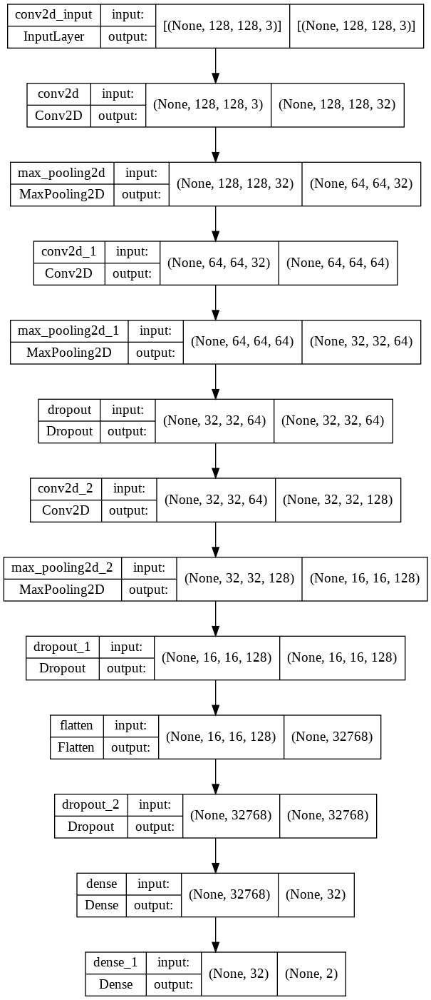

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model_clf_1, show_shapes=True)

In [ ]:
# Fit the model
history_clf_1 = model_clf_1.fit(Train_X_clf_1, Train_y, epochs=30, batch_size=32, validation_split=0.2, callbacks=[early_stop, reduce_lr])

Epoch 1/30
125/125 [==============================] - 17s 29ms/step - loss: 0.6268 - accuracy: 0.6700 - val_loss: 0.5488 - val_accuracy: 0.8160 - lr: 1.0000e-05
Epoch 2/30
125/125 [==============================] - 3s 21ms/step - loss: 0.5078 - accuracy: 0.7747 - val_loss: 0.4503 - val_accuracy: 0.8240 - lr: 1.0000e-05
Epoch 3/30
125/125 [==============================] - 3s 21ms/step - loss: 0.4741 - accuracy: 0.7908 - val_loss: 0.4306 - val_accuracy: 0.8310 - lr: 1.0000e-05
Epoch 4/30
125/125 [==============================] - 3s 21ms/step - loss: 0.4613 - accuracy: 0.7950 - val_loss: 0.4204 - val_accuracy: 0.8260 - lr: 1.0000e-05
Epoch 5/30
125/125 [==============================] - 3s 21ms/step - loss: 0.4502 - accuracy: 0.8008 - val_loss: 0.4174 - val_accuracy: 0.8280 - lr: 1.0000e-05
Epoch 6/30
125/125 [==============================] - 3s 21ms/step - loss: 0.4445 - accuracy: 0.8045 - val_loss: 0.4109 - val_accuracy: 0.8290 - lr: 1.0000e-05
Epoch 7/30
125/125 [===================

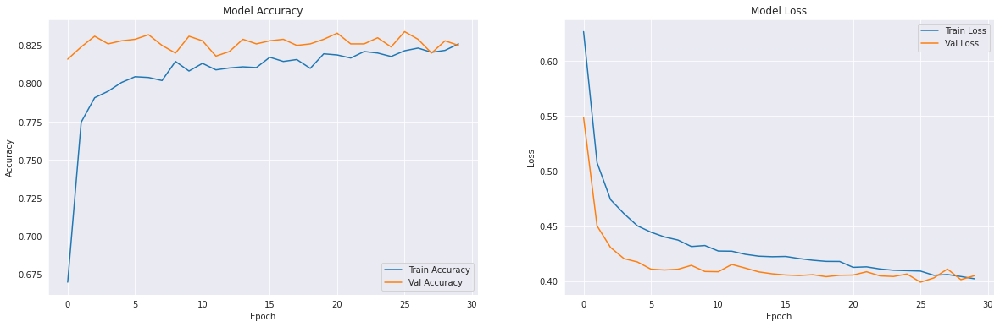

In [ ]:
# Plot accuracy and loss
plot_accuracy_loss(history=history_clf_1, model_type='CLF')

In [ ]:
# Model Evaluation
eval_acc_clf_1, eval_loss_clf_1, train_acc_clf_1, train_loss_clf_1 = evaluate_model(model_clf_1, Eval_X_clf_1, Eval_y, Train_X_clf_1, Train_y, 'CLF')

157/157 [==============================] - 2s 10ms/step - loss: 0.4027 - accuracy: 0.8272
Accuracy on Eval set = 83.24% & Loss on Eval set = 0.4106


Classification Report:

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       895
           1       0.85      0.81      0.83       901

    accuracy                           0.83      1796
   macro avg       0.83      0.83      0.83      1796
weighted avg       0.83      0.83      0.83      1796





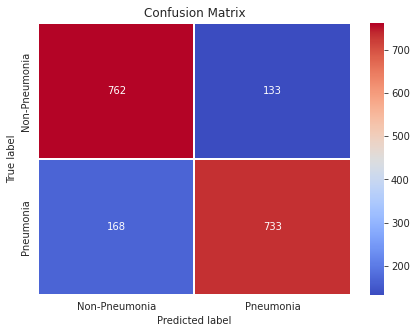

In [ ]:
# Classification report & Confusion matrix
clf_report_and_conf_matrix(model_clf_1, Eval_X_clf_1, Eval_y)

In [ ]:
# Append the scores & loss
clf_model_scores['Model'].append('Basic CNN')
clf_model_scores['Train Score'].append(train_acc_clf_1)
clf_model_scores['Eval Score'].append(eval_acc_clf_1)
clf_model_scores['Train Loss'].append(train_loss_clf_1)
clf_model_scores['Eval Loss'].append(eval_loss_clf_1)

In [ ]:
del Train_X_clf_1
del Eval_X_clf_1

**Highlights of Transfer Learning Model:**

- We will use MobileNet pre-trained on ImageNet Dataset.

- Then encode the features using MobileNet by removing the tail of dense layers.

- UNet architecture is considered in the project as it is most preferable for MEDICAL IMAGES.

- For computation restrictions, as mentioned above that for bounding boxes prediction, we are taking only images with target label 1 (Lung Opacity)

- We will be feeding 128x128x3 dimension images into the model and predicting the mask of size 128x128 and similarly we are using the same MobileNet for classification prediction.



### MobileNet Classifier Model

In [ ]:
# Apply Pre-processing
Train_X_clf_2 = tf.keras.applications.mobilenet.preprocess_input(np.copy(Train_X))
Eval_X_clf_2 = tf.keras.applications.mobilenet.preprocess_input(np.copy(Eval_X))

In [ ]:
# Instantiates the MobileNet architecture
model_clf_2_temp = tf.keras.applications.mobilenet.MobileNet(input_shape=(128, 128, 3), alpha=1.0, include_top=False, weights='imagenet')

# Previous layers are non trainable
for layer in model_clf_2_temp.layers:
    layer.trainable=False

# Classification layers
y = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(model_clf_2_temp.get_layer('conv_pw_13_relu').output)
y = tf.keras.layers.Flatten()(y)
y = tf.keras.layers.BatchNormalization()(y)
y = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01), activity_regularizer=tf.keras.regularizers.l1(0.01))(y)
y = tf.keras.layers.Dropout(0.5)(y)
y = tf.keras.layers.Dense(64, activation='relu')(y)
y = tf.keras.layers.Dropout(0.5)(y)
y = tf.keras.layers.Dense(2, activation='softmax')(y)

model_clf_2 = tf.keras.Model(inputs=model_clf_2_temp.input, outputs=y)

# Model summary
model_clf_2.summary()


# Define optimizer and compile the model
model_clf_2.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.00001, beta_1=0.9, beta_2=0.999, epsilon=1e-07),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy'])

17235968/17225924 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 64, 64, 32)        864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 64, 64, 32)       128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 64, 64, 32)        0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 64, 64, 32)       288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 64, 64, 32)       128    

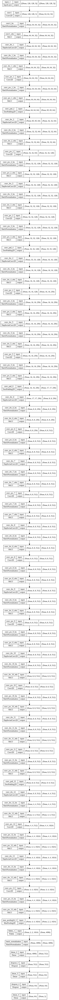

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model_clf_2, show_shapes=True)

In [ ]:
# Fit the model
history_clf_2 = model_clf_2.fit(Train_X_clf_2, Train_y, epochs=30, batch_size=32, validation_split=0.2, callbacks=[early_stop, reduce_lr])

Epoch 1/30
125/125 [==============================] - 5s 24ms/step - loss: 12.8759 - accuracy: 0.6102 - val_loss: 12.3733 - val_accuracy: 0.8020 - lr: 1.0000e-05
Epoch 2/30
125/125 [==============================] - 2s 17ms/step - loss: 12.4789 - accuracy: 0.7005 - val_loss: 12.0402 - val_accuracy: 0.8410 - lr: 1.0000e-05
Epoch 3/30
125/125 [==============================] - 2s 17ms/step - loss: 12.2509 - accuracy: 0.7427 - val_loss: 11.9661 - val_accuracy: 0.8460 - lr: 1.0000e-05
Epoch 4/30
125/125 [==============================] - 2s 17ms/step - loss: 12.1314 - accuracy: 0.7510 - val_loss: 11.9002 - val_accuracy: 0.8490 - lr: 1.0000e-05
Epoch 5/30
125/125 [==============================] - 2s 17ms/step - loss: 12.0101 - accuracy: 0.7667 - val_loss: 11.8164 - val_accuracy: 0.8540 - lr: 1.0000e-05
Epoch 6/30
125/125 [==============================] - 2s 17ms/step - loss: 11.8961 - accuracy: 0.7713 - val_loss: 11.7284 - val_accuracy: 0.8560 - lr: 1.0000e-05
Epoch 7/30
125/125 [========

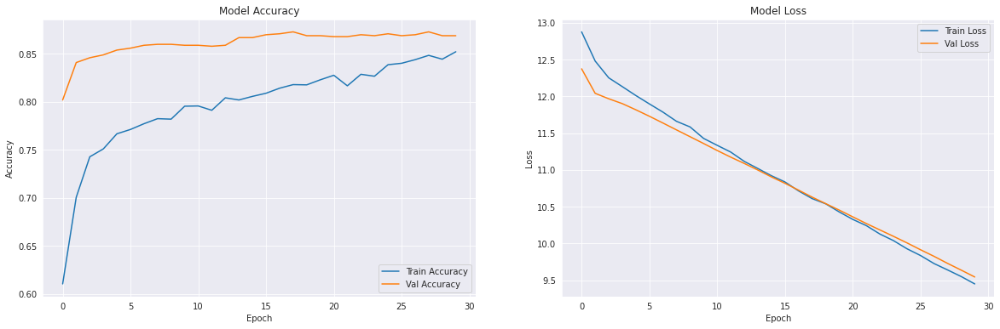

In [ ]:
# Plot accuracy and loss
plot_accuracy_loss(history=history_clf_2, model_type='CLF')

In [ ]:
# Model Evaluation
eval_acc_clf_2, eval_loss_clf_2, train_acc_clf_2, train_loss_clf_2 = evaluate_model(model_clf_2, Eval_X_clf_2, Eval_y, Train_X_clf_2, Train_y, 'CLF')

157/157 [==============================] - 2s 14ms/step - loss: 9.3639 - accuracy: 0.9284
Accuracy on Eval set = 86.86% & Loss on Eval set = 9.5320


Classification Report:

              precision    recall  f1-score   support

           0       0.89      0.84      0.86       895
           1       0.85      0.90      0.87       901

    accuracy                           0.87      1796
   macro avg       0.87      0.87      0.87      1796
weighted avg       0.87      0.87      0.87      1796





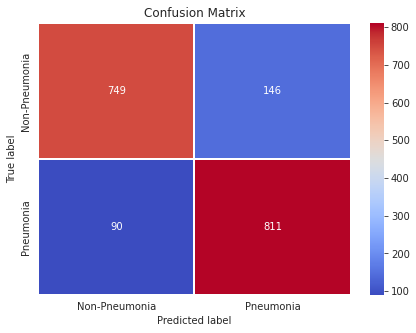

In [ ]:
# Classification report & Confusion matrix
clf_report_and_conf_matrix(model_clf_2, Eval_X_clf_2, Eval_y)

In [ ]:
# Append the scores & loss
clf_model_scores['Model'].append('MobileNet')
clf_model_scores['Train Score'].append(train_acc_clf_2)
clf_model_scores['Eval Score'].append(eval_acc_clf_2)
clf_model_scores['Train Loss'].append(train_loss_clf_2)
clf_model_scores['Eval Loss'].append(eval_loss_clf_2)

In [ ]:
del Train_X_clf_2
del Eval_X_clf_2

### InceptionV3 Classifier Model

In [ ]:
# Apply Pre-processing
Train_X_clf_3 = tf.keras.applications.inception_v3.preprocess_input(np.copy(Train_X))
Eval_X_clf_3 = tf.keras.applications.inception_v3.preprocess_input(np.copy(Eval_X))

In [ ]:
# Instantiates the InceptionV3 architecture
model_clf_3_temp = tf.keras.applications.inception_v3.InceptionV3(input_shape=(128, 128, 3), include_top=False, weights='imagenet')

# Previous layers are non trainable
for layer in model_clf_3_temp.layers:
    layer.trainable=False

input = model_clf_3_temp.input

x = tf.keras.layers.Flatten()(model_clf_3_temp.output)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
output = tf.keras.layers.Dense(2, activation='softmax')(x)

model_clf_3 = tf.keras.Model(inputs=input, outputs=output)

# Model summary
model_clf_3.summary()


# Define optimizer and compile the model
model_clf_3.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy'])

87924736/87910968 [==============================] - 2s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 63, 63, 32)   864         ['input_2[0][0]']                
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 63, 63, 32)  96          ['conv2d_3[0][0]']               
 rmalization)                                                                                     
                           

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model_clf_3, show_shapes=True)

In [ ]:
# Fit the model
history_clf_3 = model_clf_3.fit(Train_X_clf_3, Train_y, epochs=10, batch_size=32, validation_split=0.2, callbacks=[early_stop, reduce_lr])

Epoch 1/10
125/125 [==============================] - 11s 54ms/step - loss: 0.8575 - accuracy: 0.7735 - val_loss: 0.4386 - val_accuracy: 0.7970 - lr: 1.0000e-04
Epoch 2/10
125/125 [==============================] - 5s 41ms/step - loss: 0.3932 - accuracy: 0.8422 - val_loss: 0.4119 - val_accuracy: 0.8470 - lr: 1.0000e-04
Epoch 3/10
125/125 [==============================] - 5s 41ms/step - loss: 0.3293 - accuracy: 0.8610 - val_loss: 0.4521 - val_accuracy: 0.8370 - lr: 1.0000e-04
Epoch 4/10
125/125 [==============================] - 5s 38ms/step - loss: 0.2718 - accuracy: 0.8880 - val_loss: 0.4311 - val_accuracy: 0.8100 - lr: 1.0000e-04
Epoch 5/10
125/125 [==============================] - 5s 38ms/step - loss: 0.2147 - accuracy: 0.9165 - val_loss: 0.4225 - val_accuracy: 0.8250 - lr: 1.0000e-04
Epoch 6/10
125/125 [==============================] - 5s 38ms/step - loss: 0.1924 - accuracy: 0.9230 - val_loss: 0.4489 - val_accuracy: 0.8220 - lr: 1.0000e-04
Epoch 7/10
125/125 [===================

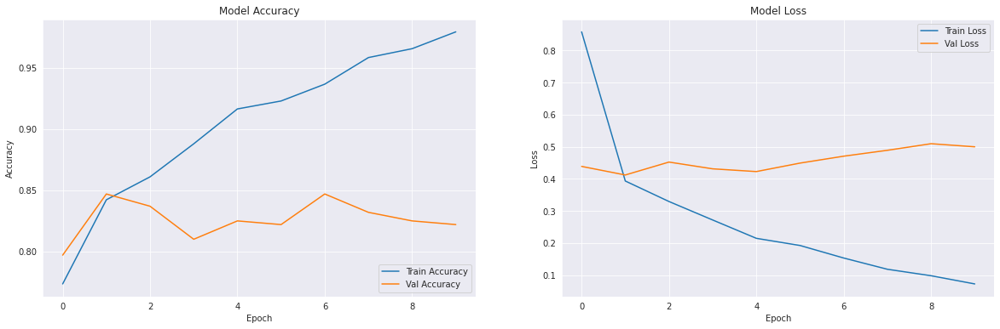

In [ ]:
# Plot accuracy and loss
plot_accuracy_loss(history=history_clf_3, model_type='CLF')

In [ ]:
# Model Evaluation
eval_acc_clf_3, eval_loss_clf_3, train_acc_clf_3, train_loss_clf_3 = evaluate_model(model_clf_3, Eval_X_clf_3, Eval_y, Train_X_clf_3, Train_y, 'CLF')

157/157 [==============================] - 5s 30ms/step - loss: 0.1337 - accuracy: 0.9612
Accuracy on Eval set = 83.35% & Loss on Eval set = 0.4629


Classification Report:

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       895
           1       0.85      0.81      0.83       901

    accuracy                           0.83      1796
   macro avg       0.83      0.83      0.83      1796
weighted avg       0.83      0.83      0.83      1796





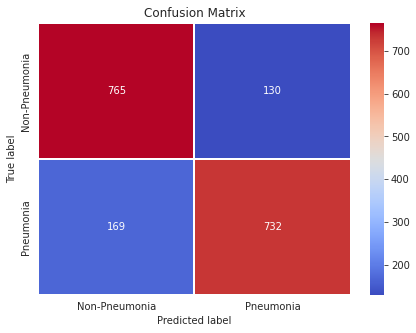

In [ ]:
# Classification report & Confusion matrix
clf_report_and_conf_matrix(model_clf_3, Eval_X_clf_3, Eval_y)

In [ ]:
# Append the scores & loss
clf_model_scores['Model'].append('InceptionV3')
clf_model_scores['Train Score'].append(train_acc_clf_3)
clf_model_scores['Eval Score'].append(eval_acc_clf_3)
clf_model_scores['Train Loss'].append(train_loss_clf_3)
clf_model_scores['Eval Loss'].append(eval_loss_clf_3)

In [ ]:
del Train_X_clf_3
del Eval_X_clf_3

### Model Evaluation

In [ ]:
# Convert dictionary into DataFrame
clf_models_df = pd.DataFrame(clf_model_scores)
clf_models_df

,Model,Train Score,Eval Score,Train Loss,Eval Loss
0,Basic CNN,82.72,83.24,0.4027,0.4106
1,MobileNet,92.84,86.86,9.3639,9.5320
2,InceptionV3,96.12,83.35,0.1337,0.4629


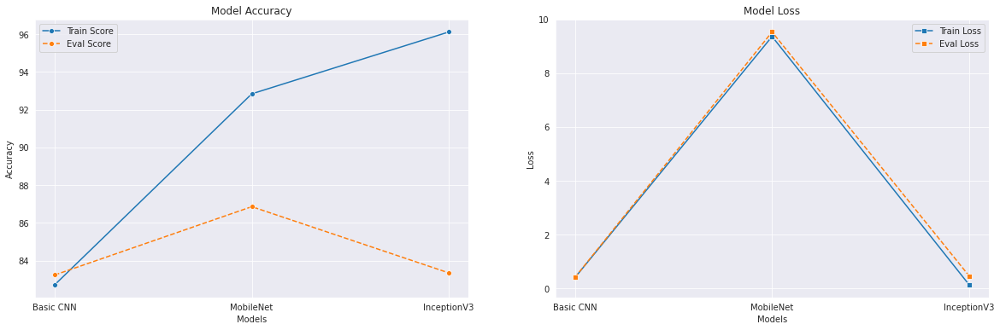

In [ ]:
# Plot the accuracy and loss for all classifier models
plt.figure(figsize=(20,6))

plt.subplot(1, 2, 1)
sns.lineplot(x=clf_models_df.Model, y=clf_models_df['Train Score'], marker='o', label='Train Score')
sns.lineplot(x=clf_models_df.Model, y=clf_models_df['Eval Score'], marker='o', label='Eval Score', linestyle='--')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(x=clf_models_df.Model, y=clf_models_df['Train Loss'], marker='s', label='Train Loss')
sns.lineplot(x=clf_models_df.Model, y=clf_models_df['Eval Loss'], marker='s', label='Eval Loss', linestyle='--')
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.show()

- MobileNet model has achieved good Train accuracy of 92% and Evaluation accuracy of 86%
- Added Regularizers in the MobileNet model for better classification.
- MobileNets are small, low-latency, low-power models parameterized to meet the resource constraints of a variety of use cases. 
- MobileNets trade off between latency, size and accuracy while comparing favorably with popular models.
- The recall for this model in predicting Pneumonia is 0.90
- The other models were not good in-terms of predicting Pneumonia as precision and recall scores are poor.
- Based on the accuracy, we've considered MobileNet as the best model for classification.

### MobileNet Unet Model

In [ ]:
# Apply Pre-processing
Train_X_unet_1 = tf.keras.applications.mobilenet.preprocess_input(np.copy(Train_X_unet))
Eval_X_unet_1 = tf.keras.applications.mobilenet.preprocess_input(np.copy(Eval_X_unet))

In [ ]:
# Instantiates the MobileNet architecture
model_unet_1_temp = tf.keras.applications.mobilenet.MobileNet(input_shape=(128, 128, 3), alpha=1.0, include_top=False, weights='imagenet')

# Previous layers are non trainable
for layer in model_unet_1_temp.layers:
    layer.trainable=False

block0 = model_unet_1_temp.input
block1 = model_unet_1_temp.get_layer('conv_pw_1_relu').output
block2 = model_unet_1_temp.get_layer('conv_pw_3_relu').output
block3 = model_unet_1_temp.get_layer('conv_pw_5_relu').output
block4 = model_unet_1_temp.get_layer('conv_pw_11_relu').output
block5 = model_unet_1_temp.get_layer('conv_pw_13_relu').output

# Decoder Blocks
x = tf.keras.layers.Concatenate()([tf.keras.layers.UpSampling2D()(block5), block4])
x = tf.keras.layers.Concatenate()([tf.keras.layers.UpSampling2D()(x), block3])
x = tf.keras.layers.Concatenate()([tf.keras.layers.UpSampling2D()(x), block2])
x = tf.keras.layers.Concatenate()([tf.keras.layers.UpSampling2D()(x), block1])
x = tf.keras.layers.Concatenate()([tf.keras.layers.UpSampling2D()(x), block0])

x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
x = tf.keras.layers.Conv2D(16, kernel_size=3, activation='relu', padding='same')(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.Conv2D(1, kernel_size=1, activation='sigmoid')(x)
x = tf.keras.layers.Reshape(target_shape=(128,128))(x)

model_unet_1 = tf.keras.Model(inputs=model_unet_1_temp.input, outputs=x)

# Model summary
model_unet_1.summary()


# Define optimizer and compile the model
model_unet_1.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07),
    loss = loss,
    metrics = [dice_coefficient])

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1 (Conv2D)                 (None, 64, 64, 32)   864         ['input_3[0][0]']                
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 64, 64, 32)   128         ['conv1[0][0]']                  
                                                                                                  
 conv1_relu (ReLU)              (None, 64, 64, 32)   0           ['conv1_bn[0][0]']         

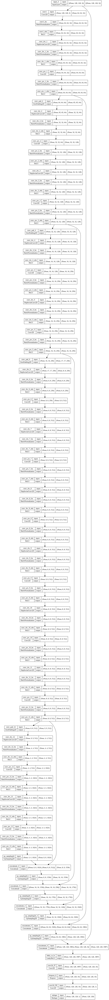

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model_unet_1, show_shapes=True)

In [ ]:
# Fit the model
history_unet_1 = model_unet_1.fit(Train_X_unet_1, Train_mask_unet, epochs=20, batch_size=32, validation_split=0.35, callbacks=[early_stop, reduce_lr])

Epoch 1/20
69/69 [==============================] - 106s 1s/step - loss: 1.2717 - dice_coefficient: 0.4543 - val_loss: 0.8655 - val_dice_coefficient: 0.5723 - lr: 1.0000e-04
Epoch 2/20
69/69 [==============================] - 89s 1s/step - loss: 0.9144 - dice_coefficient: 0.5612 - val_loss: 0.7816 - val_dice_coefficient: 0.6005 - lr: 1.0000e-04
Epoch 3/20
69/69 [==============================] - 90s 1s/step - loss: 0.8530 - dice_coefficient: 0.5857 - val_loss: 0.7570 - val_dice_coefficient: 0.6142 - lr: 1.0000e-04
Epoch 4/20
69/69 [==============================] - 90s 1s/step - loss: 0.8234 - dice_coefficient: 0.5978 - val_loss: 0.7436 - val_dice_coefficient: 0.6169 - lr: 1.0000e-04
Epoch 5/20
69/69 [==============================] - 90s 1s/step - loss: 0.8024 - dice_coefficient: 0.6051 - val_loss: 0.7317 - val_dice_coefficient: 0.6269 - lr: 1.0000e-04
Epoch 6/20
69/69 [==============================] - 90s 1s/step - loss: 0.7847 - dice_coefficient: 0.6122 - val_loss: 0.7234 - val_dic

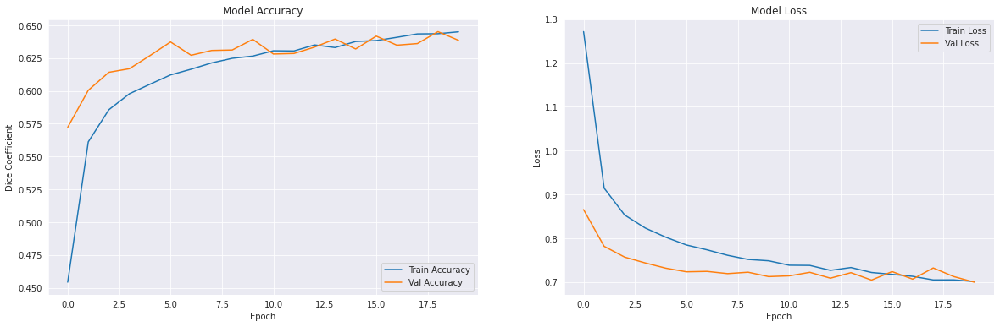

In [ ]:
# Plot accuracy and loss
plot_accuracy_loss(history=history_unet_1, model_type='UNET')

In [ ]:
# Model Evaluation
eval_acc_unet_1, eval_loss_unet_1, train_acc_unet_1, train_loss_unet_1 = evaluate_model(model_unet_1, Eval_X_unet_1, Eval_mask_unet, Train_X_unet_1, Train_mask_unet, 'UNET')

106/106 [==============================] - 44s 420ms/step - loss: 0.6790 - dice_coefficient: 0.6470
Dice Coefficient on Eval set = 0.6747 & Loss on Eval set = 0.6187


In [ ]:
# Append the scores & loss
unet_model_scores['Model'].append('MobileNet')
unet_model_scores['Train Score'].append(train_acc_unet_1)
unet_model_scores['Eval Score'].append(eval_acc_unet_1)
unet_model_scores['Train Loss'].append(train_loss_unet_1)
unet_model_scores['Eval Loss'].append(eval_loss_unet_1)

In [ ]:
del Train_X_unet_1
del Eval_X_unet_1

### Resnet34 Unet Model

In [ ]:
!pip install segmentation_models

import segmentation_models
segmentation_models.set_framework('tf.keras')
from segmentation_models import Unet
from segmentation_models import get_preprocessing

     |████████████████████████████████| 50 kB 7.2 MB/s 
Segmentation Models: using `keras` framework.


In [ ]:
BACKBONE = 'resnet34'
preprocess_input_resnet = get_preprocessing(BACKBONE)

# Apply Pre-processing
Train_X_unet_2 = preprocess_input_resnet(np.copy(Train_X_unet))
Eval_X_unet_2 = preprocess_input_resnet(np.copy(Eval_X_unet))

In [ ]:
# Instantiates the Unet architecture with resnet34 as backbone
model_unet_2 = Unet(BACKBONE, input_shape=(128, 128, 3), encoder_weights='imagenet')

# Model summary
model_unet_2.summary()


# Define optimizer and compile the model
model_unet_2.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07),
    loss = loss,
    metrics = [dice_coefficient])

85532672/85521592 [==============================] - 11s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 128, 128, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 134, 134, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)           

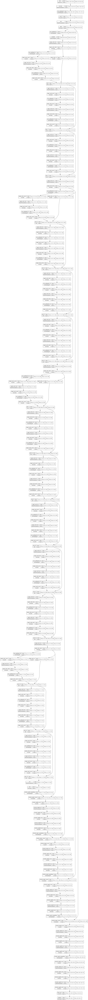

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model_unet_2, show_shapes=True)

In [ ]:
# Fit the model
history_unet_2 = model_unet_2.fit(Train_X_unet_2, Train_mask_unet, epochs=20, batch_size=32, validation_split=0.35, callbacks=[early_stop, reduce_lr])

Epoch 1/20
69/69 [==============================] - 22s 221ms/step - loss: 1.5066 - dice_coefficient: 0.3769 - val_loss: 1.6007 - val_dice_coefficient: 0.3517 - lr: 1.0000e-04
Epoch 2/20
69/69 [==============================] - 11s 163ms/step - loss: 1.0388 - dice_coefficient: 0.5048 - val_loss: 1.2645 - val_dice_coefficient: 0.4694 - lr: 1.0000e-04
Epoch 3/20
69/69 [==============================] - 11s 161ms/step - loss: 0.7888 - dice_coefficient: 0.5909 - val_loss: 0.9926 - val_dice_coefficient: 0.5369 - lr: 1.0000e-04
Epoch 4/20
69/69 [==============================] - 11s 162ms/step - loss: 0.6352 - dice_coefficient: 0.6547 - val_loss: 0.8642 - val_dice_coefficient: 0.5896 - lr: 1.0000e-04
Epoch 5/20
69/69 [==============================] - 11s 162ms/step - loss: 0.5338 - dice_coefficient: 0.7014 - val_loss: 0.7557 - val_dice_coefficient: 0.6236 - lr: 1.0000e-04
Epoch 6/20
69/69 [==============================] - 11s 163ms/step - loss: 0.4579 - dice_coefficient: 0.7394 - val_loss:

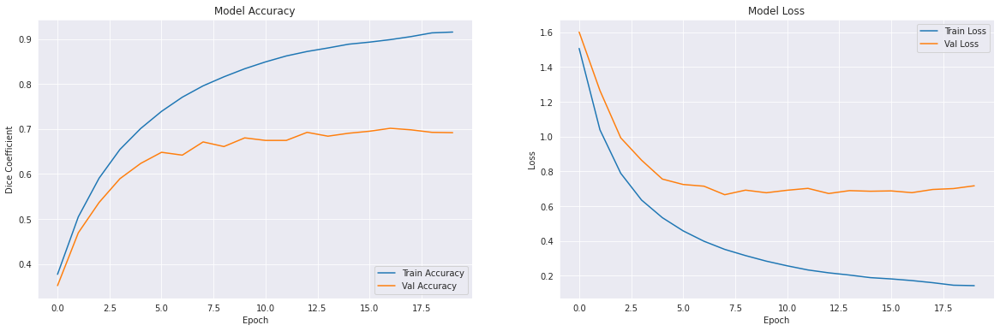

In [ ]:
# Plot accuracy and loss
plot_accuracy_loss(history=history_unet_2, model_type='UNET')

In [ ]:
# Model Evaluation
eval_acc_unet_2, eval_loss_unet_2, train_acc_unet_2, train_loss_unet_2 = evaluate_model(model_unet_2, Eval_X_unet_2, Eval_mask_unet, Train_X_unet_2, Train_mask_unet, 'UNET')

106/106 [==============================] - 5s 48ms/step - loss: 0.3443 - dice_coefficient: 0.8346
Dice Coefficient on Eval set = 0.6461 & Loss on Eval set = 0.8286


In [ ]:
# Append the scores & loss
unet_model_scores['Model'].append('Resnet34')
unet_model_scores['Train Score'].append(train_acc_unet_2)
unet_model_scores['Eval Score'].append(eval_acc_unet_2)
unet_model_scores['Train Loss'].append(train_loss_unet_2)
unet_model_scores['Eval Loss'].append(eval_loss_unet_2)

In [ ]:
del Train_X_unet_2
del Eval_X_unet_2

### InceptionV3 Unet Model

In [ ]:
BACKBONE = 'inceptionv3'
preprocess_input_incep = get_preprocessing(BACKBONE)

# Apply Pre-processing
Train_X_unet_3 = preprocess_input_incep(np.copy(Train_X_unet))
Eval_X_unet_3 = preprocess_input_incep(np.copy(Eval_X_unet))

In [ ]:
# Instantiates the Unet architecture with inceptionv3 as backbone
model_unet_3 = Unet(BACKBONE, input_shape=(128, 128, 3), encoder_weights='imagenet')

# Model summary
model_unet_3.summary()


# Define optimizer and compile the model
model_unet_3.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07),
    loss = loss,
    metrics = [dice_coefficient])

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_99 (Conv2D)             (None, 64, 64, 32)   864         ['input_4[0][0]']                
                                                                                                  
 batch_normalization_95 (BatchN  (None, 64, 64, 32)  96          ['conv2d_99[0][0]']              
 ormalization)                                                                                    
                                                                                            

In [ ]:
# Plot the model
tf.keras.utils.plot_model(model_unet_3, show_shapes=True)

In [ ]:
# Fit the model
history_unet_3 = model_unet_3.fit(Train_X_unet_3, Train_mask_unet, epochs=20, batch_size=32, validation_split=0.35, callbacks=[early_stop, reduce_lr])

Epoch 1/20
69/69 [==============================] - 32s 309ms/step - loss: 1.4180 - dice_coefficient: 0.4186 - val_loss: 2.1286 - val_dice_coefficient: 0.4065 - lr: 1.0000e-04
Epoch 2/20
69/69 [==============================] - 16s 233ms/step - loss: 0.9964 - dice_coefficient: 0.5304 - val_loss: 1.4711 - val_dice_coefficient: 0.4800 - lr: 1.0000e-04
Epoch 3/20
69/69 [==============================] - 16s 233ms/step - loss: 0.8042 - dice_coefficient: 0.5908 - val_loss: 1.1162 - val_dice_coefficient: 0.5430 - lr: 1.0000e-04
Epoch 4/20
69/69 [==============================] - 16s 234ms/step - loss: 0.6690 - dice_coefficient: 0.6427 - val_loss: 1.0249 - val_dice_coefficient: 0.5727 - lr: 1.0000e-04
Epoch 5/20
69/69 [==============================] - 16s 234ms/step - loss: 0.5715 - dice_coefficient: 0.6854 - val_loss: 0.8412 - val_dice_coefficient: 0.6141 - lr: 1.0000e-04
Epoch 6/20
69/69 [==============================] - 16s 234ms/step - loss: 0.4961 - dice_coefficient: 0.7216 - val_loss:

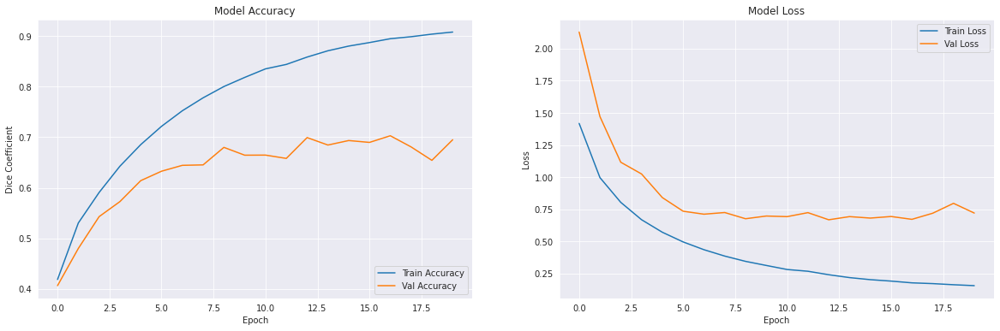

In [ ]:
# Plot accuracy and loss
plot_accuracy_loss(history=history_unet_3, model_type='UNET')

In [ ]:
# Model Evaluation
eval_acc_unet_3, eval_loss_unet_3, train_acc_unet_3, train_loss_unet_3 = evaluate_model(model_unet_3, Eval_X_unet_3, Eval_mask_unet, Train_X_unet_3, Train_mask_unet, 'UNET')

106/106 [==============================] - 8s 75ms/step - loss: 0.3479 - dice_coefficient: 0.8347
Dice Coefficient on Eval set = 0.7133 & Loss on Eval set = 0.6334


In [ ]:
# Append the scores & loss
unet_model_scores['Model'].append('InceptionV3')
unet_model_scores['Train Score'].append(train_acc_unet_3)
unet_model_scores['Eval Score'].append(eval_acc_unet_3)
unet_model_scores['Train Loss'].append(train_loss_unet_3)
unet_model_scores['Eval Loss'].append(eval_loss_unet_3)

In [ ]:
del Train_X_unet_3
del Eval_X_unet_3

### Model Evaluation

In [ ]:
# Convert dictionary into DataFrame
unet_models_df = pd.DataFrame(unet_model_scores)
unet_models_df

,Model,Train Score,Eval Score,Train Loss,Eval Loss
0,MobileNet,0.6470,0.6747,0.6790,0.6187
1,Resnet34,0.8346,0.6461,0.3443,0.8286
2,InceptionV3,0.8347,0.7133,0.3479,0.6334


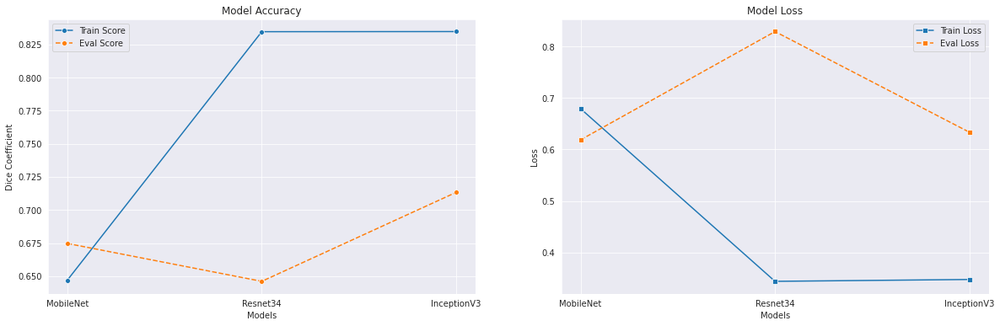

In [ ]:
# Plot the accuracy and loss for all unet models
plt.figure(figsize=(20,6))

plt.subplot(1, 2, 1)
sns.lineplot(x=unet_models_df.Model, y=unet_models_df['Train Score'], marker='o', label='Train Score')
sns.lineplot(x=unet_models_df.Model, y=unet_models_df['Eval Score'], marker='o', label='Eval Score', linestyle='--')
plt.xlabel('Models')
plt.ylabel('Dice Coefficient')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(x=unet_models_df.Model, y=unet_models_df['Train Loss'], marker='s', label='Train Loss')
sns.lineplot(x=unet_models_df.Model, y=unet_models_df['Eval Loss'], marker='s', label='Eval Loss', linestyle='--')
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.show()

- InceptionV3 unet model has achieved Dice-Coefficient of 0.83 on Train set and 0.71 on Eval set.
- Passed the variables through the pre-process function.
- The model itself is made up of symmetric and asymmetric building blocks, including convolutions, average pooling, max pooling, concatenations, dropouts, and fully connected layers.
- Batch normalization is used extensively throughout the model and applied to activation inputs.
- Added custom loss and metric(Dice-Coefficient) functions.
- Based on the Dice-Coefficient metric, we've considered InceptionV3 as the best model for predicting mask.

### Save and Load the best models

In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks')

# Save the best models
model_clf_2.save('model_clf.h5')
model_unet_3.save('model_unet.h5')

In [ ]:
os.chdir('/content/drive/MyDrive/Colab Notebooks')

# Load the saved models
final_model_clf = tf.keras.models.load_model('model_clf.h5', compile=False)
final_model_unet = tf.keras.models.load_model('model_unet.h5', compile=False)

os.chdir('/content')

# Comparison to benchmark

- In the Interim report, we've used the basic Sequential CNN model for classification which was giving 82% accuracy on both Train and Eval sets.
- The Sequential CNN model doesn't have any pre-defined weights and transfer learning is not used.
- After introducing MobileNet model for classification, we're able to achieve better Train accuracy of 92% and Eval accuracy of 86%
- The UNet architecture was introduced for BioMedical Image segmentation by Olag Ronneberger et al.
- The introduced architecture had two main parts that were encoder and decoder. The encoder is all about the covenant layers followed by pooling operation. It is used to extract the factors in the image. The second part decoder uses transposed convolution to permit localization.
- In this scenario, Unet model with InceptionV3 is used as backbone for predicting Pneumonia localization.

# Visualizations

- The required visualizations are already provided under the required headings (EDA and Model building) with comments.

# Predicting images from Test folder

In [ ]:
# Constants for the below functions
IMAGE_WIDTH = 128
IMAGE_HEIGHT = 128
RATIO = 1024/128
THRESHOLD = 0.5

In [ ]:
# Function to plot a single predicted image
def plot_single_test_image_prediction(df, image):
    plt.figure(figsize=(10,6))
    if(df.Target[0] == 1):
        plt.title('PatientID - ' + df.PatientID[0] + '\nPredicted Label - Pneumonia')
    else:
        plt.title('PatientID - ' + df.PatientID[0] + '\nPredicted Label - Non Pneumonia')
    plt.imshow(image)
    plt.axis('Off')
    plt.show()

In [ ]:
# Function to predict single image
def single_test_image_prediction(path, model_clf, model_unet, preprocess, width, height):
    points = []
    list_points = []
    col = ['X1','Y1','X2','Y2','Area']  # Columns for contours

    im = dicom.dcmread(path)  # Read Dicom image
    img_arr_org = im.pixel_array
    img_arr_org = np.stack([img_arr_org]*3, axis=2) # Convert to 3 channels
    img_arr_copy = np.copy(img_arr_org)
    patient_id = im.PatientID  # Get PatientID

    orig_im_h, orig_im_w, channels = img_arr_org.shape
    img_arr_resize = cv2.resize(img_arr_copy, (width, height))  # Resize the image
    pp_img_arr = preprocess(np.array(img_arr_resize, dtype=np.float32))  # Apply pre-process function
    pp_img_arr_ = np.expand_dims(pp_img_arr, axis=0)

    predict_vec = model_clf.predict(pp_img_arr_)  # Predict Target
    class_predicted = np.argmax(predict_vec)

    if(class_predicted == 1):
        pred_mask = model_unet.predict(pp_img_arr_)  # Predict Bounding boxes
        output = np.zeros(pp_img_arr.shape[:2], dtype=np.uint8)
        for i in range(pred_mask[0].shape[1]):
            for j in range(pred_mask[0].shape[0]):
                if pred_mask[0][i][j] > THRESHOLD:
                    x1 = int(j * pp_img_arr.shape[1] / IMAGE_WIDTH)
                    y1 = int(i * pp_img_arr.shape[0] / IMAGE_HEIGHT)
                    x2 = int((j + 1) * pp_img_arr.shape[1] / IMAGE_WIDTH)
                    y2 = int((i + 1) * pp_img_arr.shape[0] / IMAGE_HEIGHT)
                    output[y1:y2, x1:x2] = 1

        contours,_ = cv2.findContours(output, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)  # Finding all contours
        
        for cnt in contours:
            approx = cv2.approxPolyDP(cnt, 0.02*cv2.arcLength(cnt, True), True)
            x, y, w, h = cv2.boundingRect(approx)
            points.append(x)
            points.append(y)
            points.append(x+w)
            points.append(y+h)
            points.append(w*h)
            list_points.append(list(points))
            points=[]

        df = pd.DataFrame(list_points, columns=col)
        df.sort_values(by='Area', inplace=True, ascending=False)  # Sorting the area of bounding boxes
        list_points = []
        df = df[:2]  # Taking 2 sets of co-ordinates for 2 bounding boxes

        if(df.shape[0] == 2):
            x11, y11, x12, y12, _ = np.array(RATIO*np.array(df[:1])[0], dtype=np.int64)
            x21, y21, x22, y22, _ = np.array(RATIO*np.array(df[1:])[0], dtype=np.int64)
            img_arr_org = cv2.rectangle(img_arr_org, (x11,y11), (x12,y12), (220, 20, 60), 5)  # Creating bounding box 1
            img_arr_org = cv2.rectangle(img_arr_org, (x21,y21), (x22,y22), (220, 20, 60), 5)  # Creating bounding box 2
            # Dataframe to return
            pred_df = pd.DataFrame([[patient_id, x11, y11, x12, y12, x21, y21, x22, y22, class_predicted, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])

        elif(df.shape[0] == 1):
            x11, y11, x12, y12, _ = np.array(RATIO*np.array(df[:1])[0], dtype=np.int64)
            img_arr_org = cv2.rectangle(img_arr_org, (x11,y11), (x12,y12), (220, 20, 60), 5)  # Creating bounding box 1
            pred_df = pd.DataFrame([[patient_id, x11, y11, x12, y12, 0, 0, 0, 0, class_predicted, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])

        else:
            pred_df = pd.DataFrame([[patient_id, 0, 0, 0, 0, 0, 0, 0, 0, 0, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])

    else:
        # Dataframe to return
        pred_df = pd.DataFrame([[patient_id, 0, 0, 0, 0, 0, 0, 0, 0, 0, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])

    return pred_df, img_arr_org

In [ ]:
# Predicting single image from test folder which is likely to be Pneumonia
single_test_df, image = single_test_image_prediction(
    path = '/content/stage_2_test_images/139086b8-d4bf-4ee5-8027-cb405da2c2ab.dcm',
    model_clf = final_model_clf,
    model_unet = final_model_unet,
    preprocess = tf.keras.applications.mobilenet.preprocess_input,
    width = 128,
    height = 128)

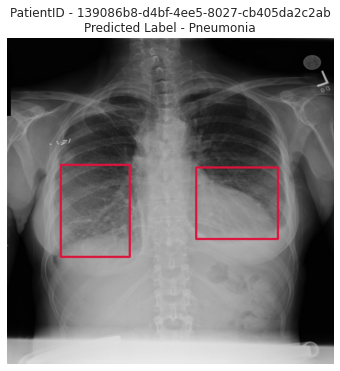

,PatientID,B1X1,B1Y1,B1X2,B1Y2,B2X1,B2Y1,B2X2,B2Y2,Target,Confidence
0,139086b8-d4bf-4ee5-8027-cb405da2c2ab,168,400,384,688,592,408,848,632,1,0.74


In [ ]:
plot_single_test_image_prediction(single_test_df, image)  # Show the output image
single_test_df  # Display the DataFrame

In [ ]:
# Predicting single image from test folder which is likely to be Non Pneumonia
single_test_df, image = single_test_image_prediction(
    path = '/content/stage_2_test_images/2704fcb3-7b66-49ed-a5ba-ea20386c824a.dcm',
    model_clf = final_model_clf,
    model_unet = final_model_unet,
    preprocess = tf.keras.applications.mobilenet.preprocess_input,
    width = 128,
    height = 128)

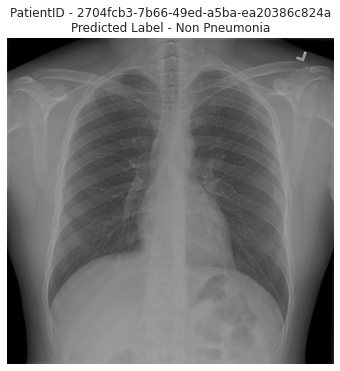

,PatientID,B1X1,B1Y1,B1X2,B1Y2,B2X1,B2Y1,B2X2,B2Y2,Target,Confidence
0,2704fcb3-7b66-49ed-a5ba-ea20386c824a,0,0,0,0,0,0,0,0,0,0.0


In [ ]:
plot_single_test_image_prediction(single_test_df, image)  # Show the output image
single_test_df  # Display the DataFrame

In [ ]:
# Function to predict all the images in the given path
def bulk_test_image_prediction(path, model_clf, model_unet, preprocess, width, height):
    points = []
    list_points = []
    col = ['X1','Y1','X2','Y2','Area']  # Columns for contours

    pred_df = pd.DataFrame(columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])
    os.chdir(path)
    folder = os.listdir()
    for im in folder:
        img = dicom.dcmread(im)  # Read Dicom image
        img_arr_org = img.pixel_array
        img_arr_org = np.stack([img_arr_org]*3, axis=2) # Convert to 3 channels
        img_arr_copy = np.copy(img_arr_org)
        patient_id = img.PatientID  # Get PatientID

        orig_im_h, orig_im_w, channels = img_arr_org.shape
        img_arr_resize = cv2.resize(img_arr_copy, (width, height))  # Resize the image
        pp_img_arr = preprocess(np.array(img_arr_resize, dtype=np.float32))  # Apply pre-process function
        pp_img_arr_ = np.expand_dims(pp_img_arr, axis=0)

        predict_vec = model_clf.predict(pp_img_arr_)  # Predict Target
        class_predicted = np.argmax(predict_vec)

        if(class_predicted == 1):
            pred_mask = model_unet.predict(pp_img_arr_)  # Predict Bounding boxes
            output = np.zeros(pp_img_arr.shape[:2], dtype=np.uint8)
            for i in range(pred_mask[0].shape[1]):
                for j in range(pred_mask[0].shape[0]):
                    if pred_mask[0][i][j] > THRESHOLD:
                        x1 = int(j * pp_img_arr.shape[1] / IMAGE_WIDTH)
                        y1 = int(i * pp_img_arr.shape[0] / IMAGE_HEIGHT)
                        x2 = int((j + 1) * pp_img_arr.shape[1] / IMAGE_WIDTH)
                        y2 = int((i + 1) * pp_img_arr.shape[0] / IMAGE_HEIGHT)
                        output[y1:y2, x1:x2] = 1

            contours,_ = cv2.findContours(output, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)  # Finding all contours

            for cnt in contours:
                approx = cv2.approxPolyDP(cnt, 0.02*cv2.arcLength(cnt, True), True)
                x, y, w, h = cv2.boundingRect(approx)
                points.append(x)
                points.append(y)
                points.append(x+w)
                points.append(y+h)
                points.append(w*h)
                list_points.append(list(points))
                points=[]

            df = pd.DataFrame(list_points, columns=col)
            df.sort_values(by='Area', inplace=True, ascending=False)  # Sorting the area of bounding boxes
            list_points = []
            df = df[:2]  # Taking 2 sets of co-ordinates for 2 bounding boxes

            if(df.shape[0] == 2):
                x11, y11, x12, y12, _ = np.array(RATIO*np.array(df[:1])[0], dtype=np.int64)  # Co-ordinates for bounding box 1
                x21, y21, x22, y22, _ = np.array(RATIO*np.array(df[1:])[0], dtype=np.int64)  # Co-ordinates for bounding box 2
                pred_1 = pd.DataFrame([[patient_id, x11, y11, x12, y12, x21, y21, x22, y22, class_predicted, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])
                # Dataframe to return
                pred_df = pd.concat([pred_df, pred_1], ignore_index=True)

            elif(df.shape[0] == 1):
                x11, y11, x12, y12, _ = np.array(RATIO*np.array(df[:1])[0], dtype=np.int64)
                pred_1 = pd.DataFrame([[patient_id, x11, y11, x12, y12, 0, 0, 0, 0, class_predicted, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])
                pred_df = pd.concat([pred_df, pred_1], ignore_index=True)

            else:
                pred_1 = pd.DataFrame([[patient_id, 0, 0, 0, 0, 0, 0, 0, 0, 0, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])
                pred_df = pd.concat([pred_df, pred_1], ignore_index=True)

        else:
            pred_0 = pd.DataFrame([[patient_id, 0, 0, 0, 0, 0, 0, 0, 0, 0, round(predict_vec[0][1],2)]], columns=['PatientID','B1X1','B1Y1','B1X2','B1Y2','B2X1','B2Y1','B2X2','B2Y2','Target','Confidence'])
            # Dataframe to return
            pred_df = pd.concat([pred_df, pred_0], ignore_index=True)

    return pred_df

In [ ]:
# Predicting all the images from test folder
bulk_test_image_prediction(
    path = '/content/stage_2_test_images',
    model_clf = final_model_clf,
    model_unet = final_model_unet,
    preprocess = tf.keras.applications.mobilenet.preprocess_input,
    width = 128,
    height = 128)

,PatientID,B1X1,B1Y1,B1X2,B1Y2,B2X1,B2Y1,B2X2,B2Y2,Target,Confidence
0,048a68fe-87f7-44a2-953d-d00651cc2605,0,0,0,0,0,0,0,0,0,0.47
1,1cec3d93-889c-4f4f-ae28-72635b933694,0,0,0,0,0,0,0,0,0,0.25
2,027301a0-cb61-4431-8736-503d0c23cd48,432,168,696,664,24,152,280,656,1,0.71
3,10cdb6ec-b1e9-45ec-a3f3-2364dd30346b,0,0,0,0,0,0,0,0,0,0.27
4,2287cc8e-e51d-4e32-9eca-760c49e4539d,504,464,672,848,240,416,408,792,1,0.93
...,...,...,...,...,...,...,...,...,...,...,...
2995,244330f7-5f3e-4c90-a20f-2e59e78c3b12,672,400,848,776,280,544,440,808,1,0.76
2996,11d313d4-1d96-4da8-8fe0-8a0db9910d04,0,0,0,0,0,0,0,0,0,0.32
2997,11f3fd57-b8c5-4345-8a32-d30b3316bf40,0,0,0,0,0,0,0,0,0,0.30
2998,2feb78d1-e0e0-42d5-a7a8-ef42e655bcac,0,0,0,0,0,0,0,0,0,0.04


# Gradio UI to display test predictions in web interface

In [ ]:
# Converting Dicom test images into Jpg to display in the Gradio UI
os.chdir('/content')
folders = ['stage_2_test_images']

for folder in folders:
    folder_path = folder
    # Check if folder exists
    if os.path.exists('JPG.'+folder):
        break
    else:
        jpg_folder_path = 'JPG.'+folder
        os.mkdir(jpg_folder_path)  # Create folder with prefix 'JPG.'
        images_path = os.listdir(folder_path)
        max_num=len(images_path)
        print('Total Images in {0} : {1}'.format(folder, max_num))
        for n, image in enumerate(images_path):
            ds = dicom.dcmread(os.path.join(folder_path, image))
            pixel_array_numpy = ds.pixel_array
            image = image.replace('.dcm', '.jpg')
            cv2.imwrite(os.path.join(jpg_folder_path, image), pixel_array_numpy)
            if n % 1000 == 0 and n != 0 :
                print('{0} images converted'.format(n))
            elif n == max_num-1 and n != 0:
                print('{0} images converted'.format(max_num))
                print('Successfully converted all images to Jpg.')

Total Images in stage_2_test_images : 3000
1000 images converted
2000 images converted
3000 images converted
Successfully converted all images to Jpg.


In [ ]:
# Install gradio
!pip install gradio

     |████████████████████████████████| 2.9 MB 5.2 MB/s 
     |████████████████████████████████| 53 kB 2.6 MB/s 
     |████████████████████████████████| 84 kB 4.4 MB/s 
     |████████████████████████████████| 212 kB 96.9 MB/s 
     |████████████████████████████████| 2.0 MB 63.0 MB/s 
     |████████████████████████████████| 253 kB 88.9 MB/s 
     |████████████████████████████████| 1.1 MB 53.5 MB/s 
     |████████████████████████████████| 54 kB 3.8 MB/s 
     |████████████████████████████████| 271 kB 20.6 MB/s 
     |████████████████████████████████| 144 kB 72.6 MB/s 
     |████████████████████████████████| 94 kB 4.7 MB/s 
     |████████████████████████████████| 59 kB 9.0 MB/s 
     |████████████████████████████████| 10.9 MB 60.5 MB/s 
     |████████████████████████████████| 79 kB 11.0 MB/s 
     |████████████████████████████████| 43 kB 2.7 MB/s 
     |████████████████████████████████| 4.0 MB 65.6 MB/s 
     |████████████████████████████████| 856 kB 64.2 MB/s 
     |█████████████████████

In [ ]:
# Function to be passed in gradio for prediction
def gradio_single_test_prediction(array):
    points = []
    list_points = []
    col = ['X1','Y1','X2','Y2','Area']  # Columns for contours

    img_arr_org = array  # Assign the input numpy array
    img_arr_copy = np.copy(img_arr_org)

    orig_im_h, orig_im_w, channels = img_arr_org.shape
    img_arr_resize = cv2.resize(img_arr_copy, (128, 128))  # Resize the image
    pp_img_arr = tf.keras.applications.mobilenet.preprocess_input(np.array(img_arr_resize, dtype=np.float32))  # Apply pre-process function
    pp_img_arr_ = np.expand_dims(pp_img_arr, axis=0)

    predict_vec = final_model_clf.predict(pp_img_arr_)  # Predict Target
    class_predicted = np.argmax(predict_vec)

    if(class_predicted == 1):
        pred_mask = final_model_unet.predict(pp_img_arr_)  # Predict Bounding boxes
        output = np.zeros(pp_img_arr.shape[:2], dtype=np.uint8)
        for i in range(pred_mask[0].shape[1]):
            for j in range(pred_mask[0].shape[0]):
                if pred_mask[0][i][j] > THRESHOLD:
                    x1 = int(j * pp_img_arr.shape[1] / IMAGE_WIDTH)
                    y1 = int(i * pp_img_arr.shape[0] / IMAGE_HEIGHT)
                    x2 = int((j + 1) * pp_img_arr.shape[1] / IMAGE_WIDTH)
                    y2 = int((i + 1) * pp_img_arr.shape[0] / IMAGE_HEIGHT)
                    output[y1:y2, x1:x2] = 1

        contours,_ = cv2.findContours(output, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)  # Finding all contours
        
        for cnt in contours:
            approx = cv2.approxPolyDP(cnt, 0.02*cv2.arcLength(cnt, True), True)
            x, y, w, h = cv2.boundingRect(approx)
            points.append(x)
            points.append(y)
            points.append(x+w)
            points.append(y+h)
            points.append(w*h)
            list_points.append(list(points))
            points=[]

        df = pd.DataFrame(list_points, columns=col)
        df.sort_values(by='Area', inplace=True, ascending=False)  # Sorting the area of bounding boxes
        list_points = []
        df = df[:2]  # Taking 2 sets of co-ordinates for 2 bounding boxes

        if(df.shape[0] == 2):
            x11, y11, x12, y12, _ = np.array(RATIO*np.array(df[:1])[0], dtype=np.int64)
            x21, y21, x22, y22, _ = np.array(RATIO*np.array(df[1:])[0], dtype=np.int64)
            img_arr_org = cv2.rectangle(img_arr_org, (x11,y11), (x12,y12), (220, 20, 60), 5)  # Creating bounding box 1
            img_arr_org = cv2.rectangle(img_arr_org, (x21,y21), (x22,y22), (220, 20, 60), 5)  # Creating bounding box 2

        elif(df.shape[0] == 1):
            x11, y11, x12, y12, _ = np.array(RATIO*np.array(df[:1])[0], dtype=np.int64)
            img_arr_org = cv2.rectangle(img_arr_org, (x11,y11), (x12,y12), (220, 20, 60), 5)  # Creating bounding box 1

        else:
            pass

    else:
        pass

    confidence = {'Pneumonia': float(predict_vec[0][1]), 'Non Pneumonia': float(1-predict_vec[0][1])}

    return img_arr_org, confidence  # Return Image and Confidence

In [ ]:
# Import gradio
import gradio as gr

# Launching gradio interface with required inputs and outputs
gr.Interface(fn = gradio_single_test_prediction,
             inputs = gr.inputs.Image(shape=(1024, 1024), image_mode='RGB', type='numpy', label='Input Image'),
             outputs = [gr.outputs.Image(label='Output Image'),
                        gr.outputs.Label(num_top_classes=2, label='Label & Confidence')],
             allow_flagging='never'
             ).launch()

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://11029.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<fastapi.applications.FastAPI at 0x7f7256679c50>,
 'http://127.0.0.1:7860/',
 'https://11029.gradio.app')

## Screenshots of the Gradio web interface

#### **_Pneumonia_**

![Test Image 1](https://raw.githubusercontent.com/hemanthraj-nellori/Pneumonia-Detection-AIML/master/Test%20Image%201.png)

#### **_Non Pneumonia_**

![Test Image 2](https://raw.githubusercontent.com/hemanthraj-nellori/Pneumonia-Detection-AIML/master/Test%20Image%202.png)

# Implications

Going back to the main aim of this project which is to build an automated pneumonia detection system to locate the position of inflammation in an image, we would say that the presented model would achieve this to a certain extent, but the model can be improved further.
Radiologists and technical experts must read and analyse high volumes of reports and present their findings. It's highly possible that they might miss some important information and record incorrect data in their findings which could be critical for the patient.  

The current model can serve as the first step of screening through the DICOM images of the patients. After the model has categorized and predicted the bounding boxes, the healthcare specialist can prioritize patients for whom the category comes to be pneumatic and have big bounding boxes. The precise area must be further investigated by the healthcare specialists as the predicted area might be too large or not accurate enough. Also, there will be some false positives generated which can be confirmed by specialist. For those images predicted with very small bounding box, healthcare specialist can look at those with a lower priority as they are deemed to have a higher probability of no pneumonia.


# Limitations

- One of the major challenges with this dataset is that there’s no defined shape of lung-opacity. Object detectors are good at identifying objects which have predefined shape.

- Class-3 which has 'No Lung Opacity/Not Normal' is removed.

- Also there is no particular defined shape size of images provided, image quality is also varying.

- Next big challenge was the computing power and GPU efficiency. This project is carried out on google Colab which did not provide with efficient GPU and hence modelling was restricted to only few epochs and finite set of data manipulation.

- Due to compute restrictions, we've trained our models with images which has 2 bounding boxes.

# Closing Reflections

In this project we learnt about DICOM images which stands for the Digital Imaging and Communications in Medicine which specifies a non-proprietary data interchange protocol, digital image format, and file structure for biomedical images and image-related information. 
Also, we were able to implement UNet model specifically for detecting bounding boxes. U-net was originally invented and first used for biomedical image segmentation. Its architecture can be broadly thought of as an encoder network followed by a decoder network.
We also understood about Pneumonia detection through chest X-rays which is one of ways of detecting Pneumonia.

We have already added an UI in which we can drop an image(in JPG format) to detect Pneumonia. So, in future automated report based out of DICOM images can also be generated and depending on bounding box area we can name the region of lung as well where the opacity is seen and opacity percentage can also be depicted.